In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from TESTPLS import huitu, huitu0

对试验段进行pls建模1，训练出过程变量对相关变量的回归系数

In [2]:
df = pd.read_excel('sanwei1.xlsx', sheet_name=None, header=None)
scaler0 = StandardScaler()  # 创建scaler对象，方便后续计算，进行反标准化
scaler1 = StandardScaler()
scaler2 = StandardScaler()
xsBh_7 = []
xsBh_8 = []
xsBh_9 = []
for i in range(30):
    rows=[]
    for j in range(17):
        rows.append(df[str(j)].iloc[i, :].to_numpy())
    matrix_org = np.vstack(rows)
    matrix_7Bh = matrix_org[:3, :]
    matrix_7Bhs = scaler0.fit_transform(matrix_7Bh)
    matrix_8Bh = matrix_org[3:10, :]
    matrix_8Bhs = scaler1.fit_transform(matrix_8Bh)
    matrix_9Bh = matrix_org[10:, :]   # 划分模态
    matrix_9Bhs = scaler2.fit_transform(matrix_9Bh)
    xsBh_7.append(huitu(matrix_7Bhs))
    xsBh_8.append(huitu(matrix_8Bhs))
    xsBh_9.append(huitu(matrix_9Bhs))

    #取均值
    b_Bh7 = np.mean(xsBh_7, axis=0)
    b_Bh8 = np.mean(xsBh_8, axis=0)
    b_Bh9 = np.mean(xsBh_9, axis=0)

    

In [3]:
b_Bh7

array([[0.39814251],
       [1.36668047],
       [1.65204179],
       [0.51382863],
       [1.1632281 ],
       [0.68939065]])

In [3]:
matrix_7Bh=[]
matrix_8Bh=[]
matrix_9Bh=[]
scaler0 = StandardScaler()  # 创建scaler对象，方便后续计算，进行反标准化
scaler1 = StandardScaler()
scaler2 = StandardScaler()
for j in range(3):
    matrix = df[str(j)].iloc[:30]
    matrix_7Bh.append(matrix)
for j in range(3,10):
    matrix = df[str(j)].iloc[:30]
    matrix_8Bh.append(matrix)
for j in range(10,18):
    matrix = df[str(j)].iloc[:30]
    matrix_9Bh.append(matrix)        
M7 = pd.concat(matrix_7Bh,ignore_index=True)
M8 = pd.concat(matrix_8Bh,ignore_index=True)
M9 = pd.concat(matrix_9Bh,ignore_index=True)
M7s = scaler0.fit_transform(M7)
M8s = scaler1.fit_transform(M8)
M9s = scaler2.fit_transform(M9)

In [31]:
M9

,0,1,2,3,4,5,6
0,409.202651,409.090912,99258.06250,58551.75391,0.000007,-0.000080,0.899584
1,409.202651,409.060608,99256.17188,58550.40234,0.000007,-0.000080,0.899588
2,409.202774,409.060608,99251.85938,58552.74219,0.003712,-0.000088,0.899506
3,409.202774,409.121216,99252.26563,58544.74609,0.015756,0.000254,0.899635
4,409.201030,409.030304,99251.64063,58552.06250,0.015756,0.000254,0.899516
...,...,...,...,...,...,...,...
235,411.074652,410.727264,99242.00000,58513.84375,3.988175,0.000033,0.900023
236,411.074652,410.666656,99243.37500,58514.89063,3.988175,0.000033,0.900021
237,411.110669,410.393951,99242.14844,58521.25000,3.998580,-0.000157,0.899914
238,411.110669,410.303040,99240.20313,58522.16406,3.999937,0.000092,0.899884


In [4]:
from sklearn.svm import SVR
import matplotlib.pyplot as plt
X_7 = M7s[:,:6]
Y_7 = M7s[:,6:].ravel()
X_8 = M8s[:,:6]
Y_8 = M8s[:,6:].ravel()
X_9 = M9s[:,:6]
Y_9 = M9s[:,6:].ravel()
# SVM建模
Svm_regression_7 = SVR()
Svm_regression_8 = SVR()
Svm_regression_9 = SVR()

In [5]:
from sklearn.model_selection import GridSearchCV

# 定义参数的组合
params = {
    'kernel': ('linear', 'rbf', 'poly', 'sigmoid'),
    'C': [12,10,5,1,4.5,12.2,14,0.8]
    }

# 用网格搜索方式拟合模型
Model_7 = GridSearchCV(Svm_regression_7, param_grid=params, cv = 5)
Model_7.fit(X_7, Y_7)
Model_8 = GridSearchCV(Svm_regression_8, param_grid=params, cv = 5)
Model_8.fit(X_8, Y_8)
Model_9 = GridSearchCV(Svm_regression_9, param_grid=params, cv = 5)
Model_9.fit(X_9, Y_9)
Best_7 = Model_7.best_estimator_
Best_8 = Model_8.best_estimator_
Best_9 = Model_9.best_estimator_
# 查看结果
# print('最好的参数组合：', model.best_params_)
# print('最好的score：', model.best_score_)
print(f'模态7最好的参数组合:{Model_7.best_params_},最好的得分：{Model_7.best_score_}')
print(f'模态8最好的参数组合:{Model_8.best_params_},最好的得分：{Model_8.best_score_}')
print(f'模态9最好的参数组合:{Model_9.best_params_},最好的得分：{Model_9.best_score_}')

模态7最好的参数组合:{'C': 4.5, 'kernel': 'linear'},最好的得分：0.9684021663477541
模态8最好的参数组合:{'C': 1, 'kernel': 'linear'},最好的得分：0.9929375686302316
模态9最好的参数组合:{'C': 12, 'kernel': 'linear'},最好的得分：0.9669471092050573


np.float64(1.4225764634155546e-05)

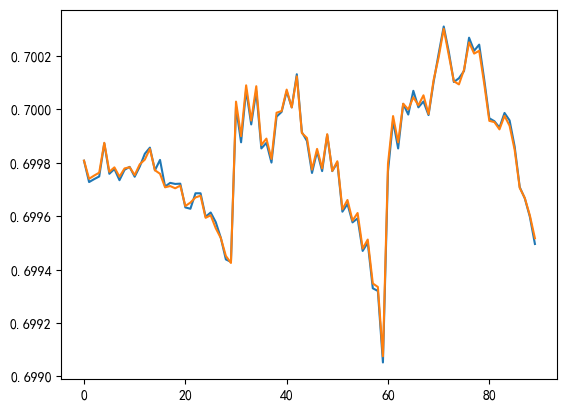

In [30]:
Y7_pred = Best_7.predict(X_7)
Y_7s = M7.iloc[:,6:].values.ravel()
Y7_preds = Y7_pred*scaler0.scale_[-1]+scaler0.mean_[-1]
Rmse_7 = np.sqrt(np.mean((Y_7s - Y7_preds) ** 2))
plt.plot(Y_7s)
plt.plot(Y7_preds)
Rmse_7

In [7]:
Y8_pred = Best_8.predict(X_8)
Y_8s = M8.iloc[:,6:].values.ravel()
Y8_preds = Y8_pred*scaler1.scale_[-1]+scaler1.mean_[-1]
Rmse_8 = np.sqrt(np.mean((Y_8s - Y8_preds) ** 2))
Rmse_8

np.float64(2.1605978233056148e-05)

In [8]:
Y9_pred = Best_9.predict(X_9)
Y_9s = M9.iloc[:,6:].values.ravel()
Y9_preds = Y9_pred*scaler2.scale_[-1]+scaler2.mean_[-1]
Rmse_9 = np.sqrt(np.mean((Y_9s - Y9_preds) ** 2))
Rmse_9

np.float64(2.2144104258143324e-05)

In [9]:
matrix_7Pw=[]
matrix_8Pw=[]
matrix_9Pw=[]
scaler3 = StandardScaler()  # 创建scaler对象，方便后续计算，进行反标准化
scaler4 = StandardScaler()
scaler5 = StandardScaler()
for j in range(3):
    matrix = df[str(j)].iloc[30:]
    matrix_7Pw.append(matrix)
for j in range(3,10):
    matrix = df[str(j)].iloc[30:]
    matrix_8Pw.append(matrix)
for j in range(10,18):
    matrix = df[str(j)].iloc[30:]
    matrix_9Pw.append(matrix)        
m7 = pd.concat(matrix_7Pw,ignore_index=True)
m8 = pd.concat(matrix_8Pw,ignore_index=True)
m9 = pd.concat(matrix_9Pw,ignore_index=True)
m7s = scaler3.fit_transform(m7)
m8s = scaler4.fit_transform(m8)
m9s = scaler5.fit_transform(m9)

In [12]:
m7

,0,1,2,3,4,5,6
0,351.282760,351.060608,99561.92188,71745.37500,1.0,0.000080,0.699306
1,351.102880,350.969696,99563.31250,71746.57813,1.0,0.000080,0.699316
2,351.067902,350.939392,99569.87500,71746.41406,1.0,0.000075,0.699388
3,351.229755,351.090912,99569.34375,71752.82813,1.0,-0.000033,0.699278
4,351.296675,351.151520,99567.38281,71751.24219,1.0,0.000064,0.699293
...,...,...,...,...,...,...,...
241,353.194740,353.060608,99446.51563,71637.29688,3.0,-0.000112,0.699705
242,353.085142,353.060608,99448.75000,71642.46094,3.0,-0.000149,0.699643
243,353.122822,353.060608,99445.40625,71638.36719,3.0,0.000142,0.699673
244,353.146906,353.090912,99442.69531,71640.32031,3.0,0.000014,0.699608


In [10]:
from sklearn.svm import SVR
import matplotlib.pyplot as plt
x_7 = m7s[:,:6]
y_7 = m7s[:,6:].ravel()
x_8 = m8s[:,:6]
y_8 = m8s[:,6:].ravel()
x_9 = m9s[:,:6]
y_9 = m9s[:,6:].ravel()
# SVM建模
svm_regression_7 = SVR()
svm_regression_8 = SVR()
svm_regression_9 = SVR()
# svm_regression_7.fit(x_7, y_7)
# svm_regression_8.fit(x_8, y_8)
# svm_regression_9.fit(x_9, y_9)
# y_pred = svm_regression_7.predict(x_7)
# Y_7 = m7[:,6:].ravel()
# Y_pred = y_pred*scaler3.scale_[-1]+scaler3.mean_[-1]
# rmse = np.sqrt(np.mean((Y_7 - Y_pred) ** 2))
# plt.plot(y_7, label="真实值", linestyle='-')
# plt.plot(y_pred, label="预测值",  linestyle='--')

# 模型效果
# print(svm_regression_7.score(x_7, y_7))
# print(svm_regression_8.score(x_8, y_8))
# print(svm_regression_9.score(x_9, y_9))

In [11]:
from sklearn.model_selection import GridSearchCV

# 定义参数的组合
params = {
    'kernel': ('linear', 'rbf', 'poly', 'sigmoid'),
    'C': [0.5,1,2,3,4,5,6,8,10,100,1.5]
    }

# 用网格搜索方式拟合模型
model_7 = GridSearchCV(svm_regression_7, param_grid=params, cv = 5)
model_7.fit(x_7, y_7)
model_8 = GridSearchCV(svm_regression_8, param_grid=params, cv = 5)
model_8.fit(x_8, y_8)
model_9 = GridSearchCV(svm_regression_9, param_grid=params, cv = 5)
model_9.fit(x_9, y_9)
best_7 = model_7.best_estimator_
best_8 = model_8.best_estimator_
best_9 = model_9.best_estimator_
# 查看结果
# print('最好的参数组合：', model.best_params_)
# print('最好的score：', model.best_score_)
print(f'模态7最好的参数组合:{model_7.best_params_},最好的得分：{model_7.best_score_}')
print(f'模态8最好的参数组合:{model_8.best_params_},最好的得分：{model_8.best_score_}')
print(f'模态9最好的参数组合:{model_9.best_params_},最好的得分：{model_9.best_score_}')

模态7最好的参数组合:{'C': 1, 'kernel': 'linear'},最好的得分：0.9788615469106403
模态8最好的参数组合:{'C': 2, 'kernel': 'linear'},最好的得分：0.9953011010764996
模态9最好的参数组合:{'C': 1, 'kernel': 'linear'},最好的得分：0.9852331476823621


In [12]:
y7_pred = best_7.predict(x_7)
y_7s = m7.iloc[:,6:].values.ravel()
y7_preds = y7_pred*scaler3.scale_[-1]+scaler3.mean_[-1]
rmse_7 = np.sqrt(np.mean((y_7s - y7_preds) ** 2))
rmse_7

np.float64(2.3544644957812336e-05)

In [13]:
y8_pred = best_8.predict(x_8)
y_8s = m8.iloc[:,6:].values.ravel()
y8_preds = y8_pred*scaler4.scale_[-1]+scaler4.mean_[-1]
rmse_8 = np.sqrt(np.mean((y_8 - y8_preds) ** 2))
rmse_8

np.float64(1.2492720766071441)

In [14]:
y9_pred = best_9.predict(x_9)
y_9s = m9.iloc[:,6:].values.ravel()
y9_preds = y9_pred*scaler5.scale_[-1]+scaler5.mean_[-1]
rmse_9 = np.sqrt(np.mean((y_9s - y9_preds) ** 2))
rmse_9

np.float64(2.5852275950122808e-05)

训练完模型，开始测试

In [15]:
#读取测试数据
df_0701 = pd.read_excel('测试数据/0.7 0 1.xlsx',header=None) #1
df_0712 = pd.read_excel('测试数据/0.7 1 2.xlsx',header=None) #2
df_0723 = pd.read_excel('测试数据/0.7 2 3.xlsx',header=None) #3
df_0734 = pd.read_excel('测试数据/0.7 3 4.xlsx',header=None)  #4
df_0804 = pd.read_excel('测试数据/0.8 0 -4.xlsx',header=None) #5
df_0830 = pd.read_excel('测试数据/0.8 3 0.xlsx',header=None)  #6
df_0701

,0,1,2,3,4,5,6
0,351.177554,351.090912,99596.83594,71738.74219,0.000000,0.000086,0.699808
1,351.018688,351.030304,99592.61719,71740.83594,0.000026,0.000034,0.699728
2,351.188860,351.090912,99588.87500,71737.11719,0.001353,0.000084,0.699739
3,351.187535,351.121216,99585.18750,71734.11719,0.005541,0.000154,0.699749
4,350.883811,350.848480,99592.29688,71731.27344,0.015756,0.000026,0.699873
...,...,...,...,...,...,...,...
110,351.442629,351.393951,99528.43750,71680.18750,1.000000,-0.000036,0.699949
111,351.432310,351.424255,99530.79688,71677.23438,1.000000,-0.000036,0.700018
112,351.317346,351.393951,99534.03125,71678.21875,1.000000,0.000018,0.700045
113,351.386458,351.424255,99533.43750,71675.38281,1.000000,0.000097,0.700083


模态融合模型

In [16]:
x1 = df_0701.iloc[:,:6]
y1 = df_0701.iloc[:, 6:]
x2 = df_0712.iloc[:,:6]
y2 = df_0712.iloc[:, 6:]
x3 = df_0723.iloc[:,:6]
y3 = df_0723.iloc[:, 6:]
x4 = df_0734.iloc[:,:6]
y4 = df_0734.iloc[:, 6:]
x5 = df_0804.iloc[:,:6]
y5 = df_0804.iloc[:, 6:]
x6 = df_0830.iloc[:,:6]
y6 = df_0830.iloc[:, 6:]

x1_std = StandardScaler().fit_transform(x1)
x2_std = StandardScaler().fit_transform(x2)
x3_std = StandardScaler().fit_transform(x3)
x4_std = StandardScaler().fit_transform(x4)
x5_std = StandardScaler().fit_transform(x5)
x6_std = StandardScaler().fit_transform(x6)

In [20]:
y6

,6
0,0.800346
1,0.800343
2,0.800567
3,0.800275
4,0.800427
...,...
250,0.799595
251,0.799641
252,0.799666
253,0.799715


In [21]:
x1_std

array([[-9.04534447e-01, -8.98957622e-01,  2.18354865e+00,
         4.10944802e-01, -2.95776599e+00,  5.10956330e-01],
       [-1.62133753e+00, -1.17464809e+00,  1.94598770e+00,
         4.94463216e-01, -2.95767718e+00, -4.56044812e-02],
       [-8.53521797e-01, -8.98957622e-01,  1.73526219e+00,
         3.46124540e-01, -2.95314478e+00,  4.89550145e-01],
       [-8.59500195e-01, -7.61112389e-01,  1.52761632e+00,
         2.26456365e-01, -2.93884057e+00,  1.23876662e+00],
       [-2.22990228e+00, -2.00171949e+00,  1.92795080e+00,
         1.13020907e-01, -2.90395101e+00, -1.31229221e-01],
       [-2.43396191e+00, -2.00171949e+00,  2.04101208e+00,
         4.62053085e-01, -2.75946755e+00, -7.77137587e-02],
       [-1.23607606e+00, -1.17464809e+00,  1.83116671e+00,
         3.04677069e-01, -2.75946755e+00, -7.77137587e-02],
       [-1.14145946e+00, -8.98957622e-01,  1.78101467e+00,
         3.80716222e-01, -2.59047430e+00,  8.53455290e-01],
       [-1.11003791e+00, -8.98957622e-01,  1.501

编写 假设质量预测函数

In [22]:
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import train_test_split

def muil_prediction(x, y,idx_turn = 30):
    s1 = StandardScaler()
    s2 = StandardScaler()
    ret8=[]
    ret9=[]
    X_test = x.iloc[:idx_turn,:]
    x_test = x.iloc[idx_turn:,:]
    X_test1 = (X_test - scaler1.mean_[:6]) / scaler1.scale_[:6]
    X_test2 = (X_test - scaler2.mean_[:6]) / scaler2.scale_[:6]
    x_test1 = (x_test - scaler4.mean_[:6]) / scaler4.scale_[:6]
    x_test2 = (x_test - scaler5.mean_[:6]) / scaler5.scale_[:6]
    G2 = Best_8.predict(X_test1)*scaler1.scale_[-1]+scaler1.mean_[-1]
    G3 = Best_9.predict(X_test2)*scaler2.scale_[-1]+scaler2.mean_[-1]
    g2 = best_8.predict(x_test1)*scaler4.scale_[-1]+scaler4.mean_[-1]
    g3 = best_9.predict(x_test2)*scaler5.scale_[-1]+scaler5.mean_[-1]
        
    for item in G2 :
        ret8.append(np.array([item]))
    for item in G3 :
        ret9.append(np.array([item]))


    for item in g2 :
        ret8.append(np.array([item]))
    for item in g3 :
        ret9.append(np.array([item]))
    retp = np.hstack([ret8,ret9])
    X_train, X_test, y_train, y_test = train_test_split(retp, y, test_size=0.3, random_state=68688)
    X_trains = s1.fit_transform(X_train)
    y_trains = s2.fit_transform(y_train)
    pls = PLSRegression(n_components=2)
    pls.fit(X_trains, y_trains)
    coefficients = pls.coef_

    # 输出结果
    print("PLS回归系数矩阵:", coefficients)
    result0 = pls.predict(s1.transform(X_test))*s2.scale_[-1]+s2.mean_[-1]
    rmse0 = np.sqrt(np.mean((y_test - result0) ** 2))
    r_2 = pls.score(s1.transform(X_test),s2.transform(y_test))
    result1 = pls.predict(s1.transform(retp))*s2.scale_[-1]+s2.mean_[-1]
    rmse1 = np.sqrt(np.mean((y - result1) ** 2))
    print(r_2)
    print(f'测试集上均方根误差:{rmse0}')
    print(f'全集上均方根误差:{rmse1}')
    plt.plot(y, label="真实值", linestyle='-')
    plt.plot(result1, label="预测值",  linestyle='--')
    plt.legend()
    return result1
    
    


In [18]:
def muil_prediction1(x, y,idx_turn = 30):
    s1 = StandardScaler()
    s2 = StandardScaler()
    ret8=[]
    ret9=[]
    X_test = x[:idx_turn,:]
    x_test = x[idx_turn:,:]
    G2 = Best_8.predict(X_test)*scaler1.scale_[-1]+scaler1.mean_[-1]
    G3 = Best_9.predict(X_test)*scaler2.scale_[-1]+scaler2.mean_[-1]
    g2 = best_8.predict(x_test)*scaler4.scale_[-1]+scaler4.mean_[-1]
    g3 = best_9.predict(x_test)*scaler5.scale_[-1]+scaler5.mean_[-1]
        
    for item in G2 :
        ret8.append(np.array([item]))
    for item in G3 :
        ret9.append(np.array([item]))


    for item in g2 :
        ret8.append(np.array([item]))
    for item in g3 :
        ret9.append(np.array([item]))
    retp = np.hstack([ret8,ret9])
    X_train, X_test, y_train, y_test = train_test_split(retp, y, test_size=0.3, random_state=68688)
    X_trains = s1.fit_transform(X_train)
    y_trains = s2.fit_transform(y_train)
    pls = PLSRegression(n_components=2)
    pls.fit(X_trains, y_trains)
    result0 = pls.predict(s1.transform(X_test))*s2.scale_[-1]+s2.mean_[-1]
    rmse0 = np.sqrt(np.mean((y_test - result0) ** 2))
    r_2 = pls.score(s1.transform(X_test),s2.transform(y_test))
    result1 = pls.predict(s1.transform(retp))*s2.scale_[-1]+s2.mean_[-1]
    rmse1 = np.sqrt(np.mean((y - result1) ** 2))
    print(r_2)
    print(f'测试集上均方根误差:{rmse0}')
    print(f'全集上均方根误差:{rmse1}')
    plt.plot(y, label="真实值", linestyle='-')
    plt.plot(result1, label="预测值",  linestyle='--')
    plt.legend()
    return result1

模态融合训练

PLS回归系数矩阵: [[2.58674872 2.50064049]]
0.9945287019431978
测试集上均方根误差:2.4307826440749585e-05
全集上均方根误差:1.7067086807095736e-05


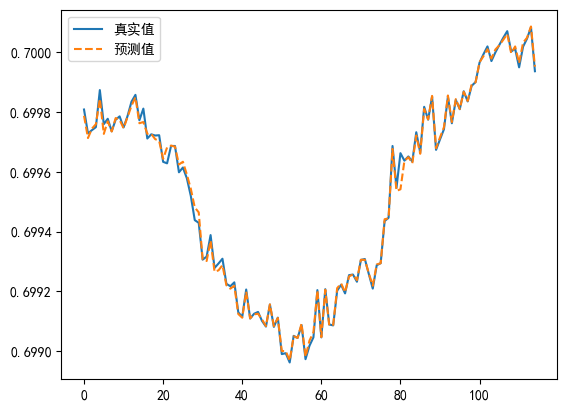

In [23]:
result1 = muil_prediction(x1, y1)

PLS回归系数矩阵: [[1.63067606 1.14202629]]
0.9996431283607832
测试集上均方根误差:9.789501831799247e-06
全集上均方根误差:1.0423495043811765e-05


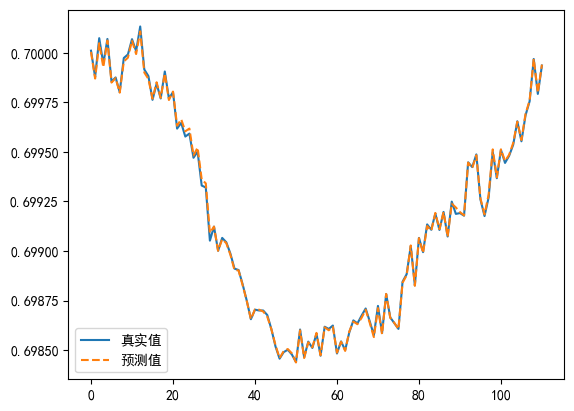

In [24]:
result2 = muil_prediction(x2, y2)

PLS回归系数矩阵: [[1.87098467 1.18044088]]
0.9994118441649273
测试集上均方根误差:9.912273227184126e-06
全集上均方根误差:1.0663781396756664e-05


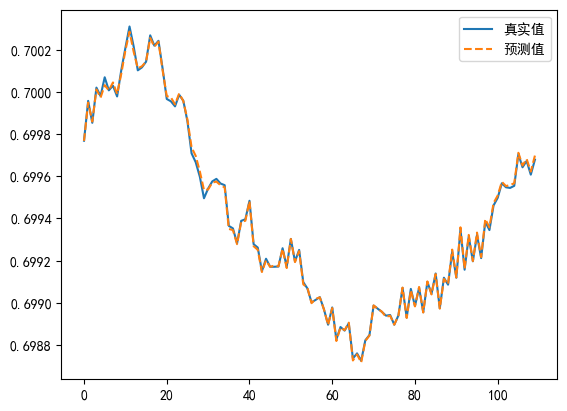

In [25]:
result3 = muil_prediction(x3, y3)

PLS回归系数矩阵: [[2.47460826 1.71108623]]
0.9996446959309384
测试集上均方根误差:7.729040531018796e-06
全集上均方根误差:7.15351294770934e-06


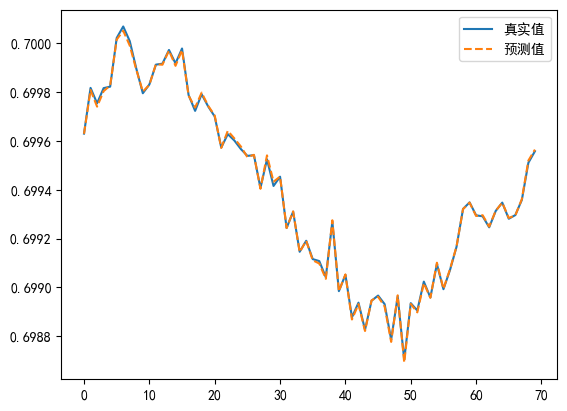

In [26]:
result4 = muil_prediction(x4, y4)

PLS回归系数矩阵: [[0.47066857 1.07259065]]
0.9332656689582163
测试集上均方根误差:8.393463154209175e-05
全集上均方根误差:0.00011371096631255296


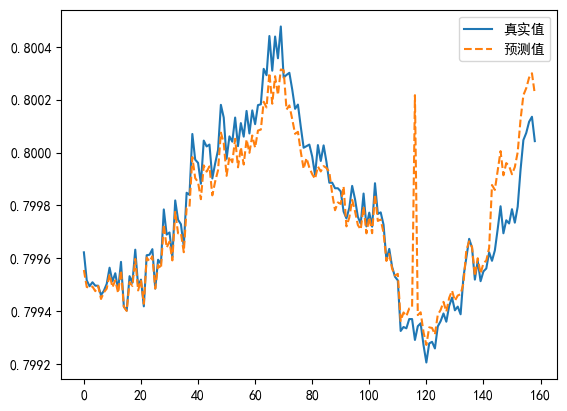

In [27]:
result5 = muil_prediction(x5, y5, 143)

PLS回归系数矩阵: [[0.26515986 0.84874814]]
0.7684795387253834
测试集上均方根误差:0.00021840981049615245
全集上均方根误差:0.00022633750054606636


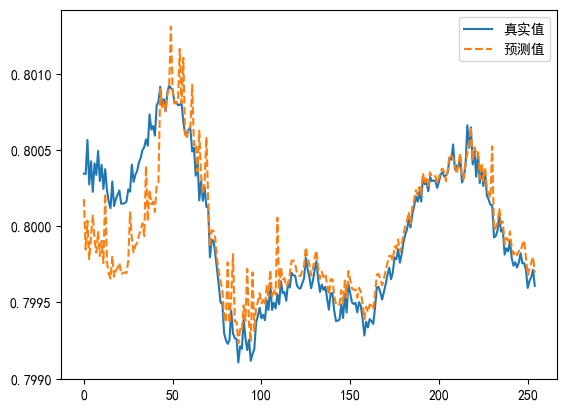

In [28]:
result6 = muil_prediction(x6, y6, 43)

0.9820617983569997
测试集上均方根误差:4.3516702936463616e-05
全集上均方根误差:3.360132479298774e-05


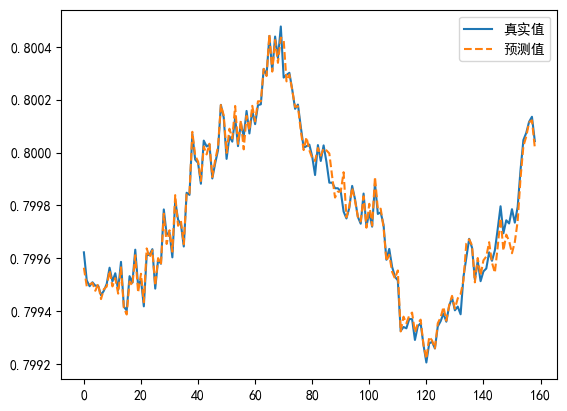

In [32]:
result50 = muil_prediction1(x5_std, y5, 143)

0.9914961041498316
测试集上均方根误差:4.185876577499508e-05
全集上均方根误差:4.606546655296978e-05


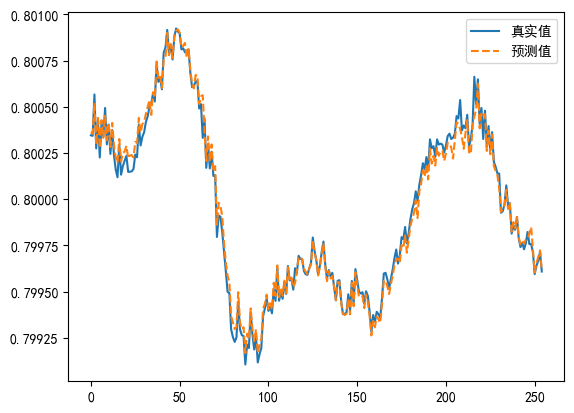

In [33]:
result60  = muil_prediction1(x6_std, y6,43)

In [34]:
import pandas as pd
result_1 = np.array(result1).flatten()
result_2 = np.array(result2).flatten()
result_3 = np.array(result3).flatten()
result_4 = np.array(result4).flatten()
result_5 = np.array(result5).flatten()
result_6 = np.array(result6).flatten()

y11 = y1[6].tolist()
y22 = y2[6].tolist()
y33 = y3[6].tolist()
y44 = y4[6].tolist()
y55 = y5[6].tolist()
y66 = y6[6].tolist()


assert len(y11) == len(result_1), "y1和result_1长度不一致"
assert len(y22) == len(result_2), "y2和result_2长度不一致"
assert len(y33) == len(result_3), "y3和result_3长度不一致"
assert len(y44) == len(result_4), "y4和result_4长度不一致"
assert len(y55) == len(result_5), "y5和result_5长度不一致"
assert len(y66) == len(result_6), "y6和result_6长度不一致"

max_length = max(len(y11), len(y22), len(y33), len(y44), len(y55), len(y66))

# 定义填充函数
def pad_data(data, target_length):
    return list(data) + [np.nan] * (target_length - len(data))

# 统一所有列的长度
data_res = {
    'y1': pad_data(y11, max_length),
    'result_1': pad_data(result_1, max_length),
    'y2': pad_data(y22, max_length),
    'result_2': pad_data(result_2, max_length),
    'y3': pad_data(y33, max_length),
    'result_3': pad_data(result_3, max_length),
    'y4': pad_data(y44, max_length),
    'result_4': pad_data(result_4, max_length),
    'y5': pad_data(y55, max_length),
    'result_5': pad_data(result_5, max_length),
    'y6': pad_data(y66, max_length),
    'result_6': pad_data(result_6, max_length)

}

# 生成DataFrame
df = pd.DataFrame(data_res)
df.to_excel('output_muilt.xlsx', index=False)




In [35]:
df_0804

,0,1,2,3,4,5,6
0,381.420329,381.212128,99266.97656,65031.97656,0.000000,0.000081,0.799623
1,381.340623,381.272736,99262.83594,65034.46875,-0.000009,0.000373,0.799517
2,381.492279,381.272736,99259.25000,65032.91797,-0.000841,0.000067,0.799495
3,381.400994,381.333344,99258.98438,65032.44922,-0.006263,-0.000195,0.799510
4,381.446046,381.303040,99263.77344,65036.45703,-0.006263,-0.000195,0.799497
...,...,...,...,...,...,...,...
154,381.409870,381.393951,99279.01563,65010.92578,-4.000000,-0.000009,0.800047
155,381.329627,381.484863,99278.78125,65008.64453,-4.000000,0.000508,0.800074
156,381.429363,381.393951,99279.46875,65006.30078,-4.000000,0.000139,0.800116
157,381.422175,381.393951,99286.31250,65009.53906,-4.000000,0.000139,0.800135


单模态回归建模

对新模态进行单模态建模

In [36]:
# 新模态2的数据
matrix_10Bh=[]
matrix_10Pw=[]
scaler6 = StandardScaler()  # 创建scaler对象，方便后续计算，进行反标准化
scaler7 = StandardScaler()
scaler10 = StandardScaler()
scaler11 = StandardScaler()
bh5 = df_0804.iloc[:143]
pw5 = df_0830.iloc[143:]
bh6 = df_0804.iloc[:43]
pw6 = df_0830.iloc[43:]
# 先划分数据集，再合并
x_5bx ,x_5bc,y_5bx, y_5bc =  train_test_split(bh5.iloc[:,:6],bh5.iloc[:,6:] ,test_size=0.3, random_state=866) # 早日发财
x_6bx ,x_6bc,y_6bx, y_6bc =  train_test_split(bh6.iloc[:,:6],bh6.iloc[:,6:] ,test_size=0.3, random_state=866)
x_5px ,x_5pc,y_5px, y_5pc =  train_test_split(pw5.iloc[:,:6],pw5.iloc[:,6:] ,test_size=0.3, random_state=866)
x_6px ,x_6pc,y_6px, y_6pc =  train_test_split(pw6.iloc[:,:6],pw6.iloc[:,6:] ,test_size=0.3, random_state=866)
# 得到标准化对象，方便后续反归一化
matrix_10Bh.append(df_0804.iloc[:143])
matrix_10Bh.append(df_0830.iloc[:43])
matrix_10Pw.append(df_0804.iloc[143:]) 
matrix_10Pw.append(df_0830.iloc[43:])
M1 = pd.concat(matrix_10Bh,ignore_index=True)
M2 = pd.concat(matrix_10Pw,ignore_index=True)
# M1s = scaler6.fit_transform(M1.iloc[:,:6])
# M2s = scaler7.fit_transform(M2.iloc[:,:6])

# 拼接出训练数据和测试数据
# 拼接试验段数据
X_b = scaler6.fit_transform(pd.concat([x_5bx, x_6bx], axis=0))  # 训练集的x数据
y_b = scaler10.fit_transform(pd.concat([y_5bx, y_6bx], axis=0)).ravel()  # 训练集的y数据

X_b_test = scaler6.transform(pd.concat([x_5bc, x_6bc], axis=0))  # 测试集的x数据
y_b_test = StandardScaler().fit_transform(pd.concat([y_5bc, y_6bc], axis=0)).ravel()  # 测试集的y数据

# 拼接预设段数据
X_p = scaler7.fit_transform(pd.concat([x_5px, x_6px], axis=0))  # 训练集的x数据
y_p = scaler11.fit_transform(pd.concat([y_5px, y_6px], axis=0)).ravel()  # 训练集的y数据

X_p_test = scaler7.transform(pd.concat([x_5pc, x_6pc], axis=0))  # 测试集的x数据
y_p_test = StandardScaler().fit_transform(pd.concat([y_5pc, y_6pc], axis=0)).ravel()  # 测试集的y数据


In [37]:
# 新模态1的数据
matrix_11Bh=[]
matrix_11Pw=[]
scaler8 = StandardScaler()  # 创建scaler对象，方便后续计算，进行反标准化
scaler9 = StandardScaler()
scaler12 = StandardScaler()
scaler13 = StandardScaler()
bh1 = df_0701.iloc[:30]
pw1 = df_0701.iloc[30:]
bh2 = df_0712.iloc[:30]
pw2 = df_0712.iloc[30:]
bh3 = df_0723.iloc[:30]
pw3 = df_0723.iloc[30:]
bh4 = df_0734.iloc[:30]
pw4 = df_0734.iloc[30:]

x_1bx ,x_1bc,y_1bx, y_1bc =  train_test_split(bh1.iloc[:,:6],bh1.iloc[:,6:] ,test_size=0.3, random_state=8888) # 早日发财
x_2bx ,x_2bc,y_2bx, y_2bc =  train_test_split(bh2.iloc[:,:6],bh2.iloc[:,6:] ,test_size=0.3, random_state=8888)
x_3bx ,x_3bc,y_3bx, y_3bc =  train_test_split(bh3.iloc[:,:6],bh3.iloc[:,6:] ,test_size=0.3, random_state=8888) 
x_4bx ,x_4bc,y_4bx, y_4bc =  train_test_split(bh4.iloc[:,:6],bh4.iloc[:,6:] ,test_size=0.3, random_state=8888)
x_1px ,x_1pc,y_1px, y_1pc =  train_test_split(pw1.iloc[:,:6],pw1.iloc[:,6:] ,test_size=0.3, random_state=8888)
x_2px ,x_2pc,y_2px, y_2pc =  train_test_split(pw2.iloc[:,:6],pw2.iloc[:,6:] ,test_size=0.3, random_state=8888)
x_3px ,x_3pc,y_3px, y_3pc =  train_test_split(pw3.iloc[:,:6],pw3.iloc[:,6:] ,test_size=0.3, random_state=8888)
x_4px ,x_4pc,y_4px, y_4pc =  train_test_split(pw4.iloc[:,:6],pw4.iloc[:,6:] ,test_size=0.3, random_state=8888)


# 得到标准化对象
matrix_11Bh.append(df_0701.iloc[:30])
matrix_11Bh.append(df_0712.iloc[:30])
matrix_11Bh.append(df_0723.iloc[:30])
matrix_11Bh.append(df_0734.iloc[:30])

matrix_11Pw.append(df_0701.iloc[30:]) 
matrix_11Pw.append(df_0712.iloc[30:])
matrix_11Pw.append(df_0723.iloc[30:]) 
matrix_11Pw.append(df_0734.iloc[30:])

M3 = pd.concat(matrix_11Bh,ignore_index=True)
M4 = pd.concat(matrix_11Pw,ignore_index=True)
# M3s = scaler8.fit_transform(M3.iloc[:,:6])
# M4s = scaler9.fit_transform(M4.iloc[:,:6])

# 拼接出训练数据和测试数据
# 拼接试验段数据
X_b1 = scaler8.fit_transform(pd.concat([x_1bx, x_2bx, x_3bx, x_4bx], axis=0))  # 训练集的x数据
y_b1 = scaler12.fit_transform(pd.concat([y_1bx, y_2bx, y_3bx, y_4bx], axis=0)).ravel()  # 训练集的y数据

X_b1_test = scaler8.transform(pd.concat([x_1bc, x_2bc, x_3bc, x_4bc], axis=0))  # 测试集的x数据
y_b1_test = StandardScaler().fit_transform(pd.concat([y_1bc, y_2bc, y_3bc, y_4bc], axis=0)).ravel()  # 测试集的y数据

# 拼接预设段数据
X_p1 = scaler9.fit_transform(pd.concat([x_1px, x_2px, x_3px, x_4px], axis=0))  # 训练集的x数据
y_p1 = scaler13.fit_transform(pd.concat([y_1px, y_2px, y_3px, y_4px], axis=0)).ravel()  # 训练集的y数据

X_p1_test = scaler9.transform(pd.concat([x_1pc, x_2pc, x_3pc, x_4pc], axis=0))  # 测试集的x数据
y_p1_test = StandardScaler().fit_transform(pd.concat([y_1pc, y_2pc, y_3pc, y_4pc], axis=0)).ravel()  # 测试集的y数据

In [38]:

# 新模态2 SVM建模
Svm_regression_1 = SVR()
Svm_regression_2 = SVR()

In [39]:
# 新模态1 SVM建模
svm_regression_1 = SVR()
svm_regression_2 = SVR()

In [40]:
params = {
    'kernel': ('linear', 'rbf', 'poly', 'sigmoid'),
    'C': [0.1,0.5,1,2,3,4,5,3.5,4.3,0.4,0.3,0.25,0.2,10,50,15]
    }

# 用网格搜索方式拟合模型
Model_1 = GridSearchCV(Svm_regression_1, param_grid=params, cv = 5)
Model_1.fit(X_b, y_b)
Model_2 = GridSearchCV(Svm_regression_2, param_grid=params, cv = 5)
Model_2.fit(X_p, y_p)
Best_1 = Model_1.best_estimator_
Best_2 = Model_2.best_estimator_

# 查看结果
# print('最好的参数组合：', model.best_params_)
# print('最好的score：', model.best_score_)
print(f'模态2最好的参数组合,phase1:{Model_1.best_params_},最好的得分：{Model_1.best_score_}')
print(f'模态2最好的参数组合,phase2:{Model_2.best_params_},最好的得分：{Model_2.best_score_}')


模态2最好的参数组合,phase1:{'C': 10, 'kernel': 'linear'},最好的得分：0.9883502655366276
模态2最好的参数组合,phase2:{'C': 3, 'kernel': 'linear'},最好的得分：0.9914826232300694


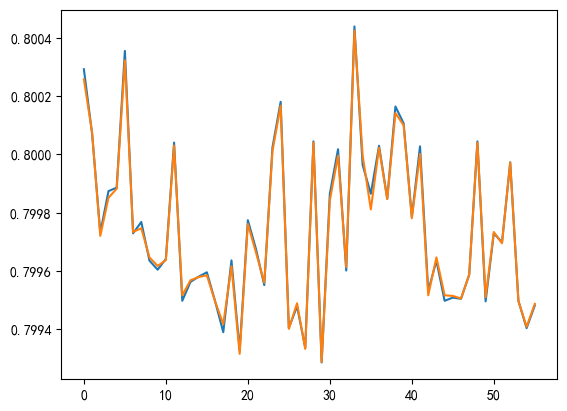

In [41]:
r1_try = Best_1.predict(X_b_test)*scaler10.scale_[-1]+scaler10.mean_[-1]
y11111 = pd.concat([y_5bc, y_6bc], axis=0).values.ravel()
plt.plot(y11111)
plt.plot(r1_try)

In [42]:
params = {
    'kernel': ('linear', 'rbf', 'poly', 'sigmoid'),
    'C': [0.1,0.5,1,2,3,4,5,3.5,4.3,0.4,0.3,0.25,0.2,3.8,0.8,5]
    }

# 用网格搜索方式拟合模型
Model_3 = GridSearchCV(svm_regression_1, param_grid=params, cv = 5)
Model_3.fit(X_b1, y_b1)
Model_4 = GridSearchCV(svm_regression_2, param_grid=params, cv = 5)
Model_4.fit(X_p1, y_p1)
Best_3 = Model_3.best_estimator_
Best_4 = Model_4.best_estimator_

# 查看结果
# print('最好的参数组合：', model.best_params_)
# print('最好的score：', model.best_score_)
print(f'模态1最好的参数组合,phase1:{Model_3.best_params_},最好的得分：{Model_3.best_score_}')
print(f'模态1最好的参数组合,phase2:{Model_4.best_params_},最好的得分：{Model_4.best_score_}')

模态1最好的参数组合,phase1:{'C': 4.3, 'kernel': 'linear'},最好的得分：0.9899404482533098
模态1最好的参数组合,phase2:{'C': 2, 'kernel': 'linear'},最好的得分：0.9931391301120822


训练完，输出结果

In [43]:
def sl8_prediction(x,idx_turn = 30):
    ret=[]
    x_b = x.iloc[:idx_turn]
    x_p = x.iloc[idx_turn:]
    x_bs = scaler6.transform(x_b)
    x_ps = scaler7.transform(x_p)
    G = Best_1.predict(x_bs)*scaler10.scale_[-1]+scaler10.mean_[-1]
    g = Best_2.predict(x_ps)*scaler11.scale_[-1]+scaler11.mean_[-1]
    for item in G :
        ret.append(np.array([item]))
    for item in g :
        ret.append(np.array([item]))
    return np.array(ret)

In [44]:
def sl7_prediction(x,idx_turn = 30):
    x_b = x.iloc[:idx_turn]
    x_p = x.iloc[idx_turn:]
    x_bs = scaler8.transform(x_b)
    x_ps = scaler9.transform(x_p)
    ret=[]
    G = Best_3.predict(x_bs)*scaler12.scale_[-1]+scaler12.mean_[-1]
    g = Best_4.predict(x_ps)*scaler13.scale_[-1]+scaler13.mean_[-1]
    for item in G :
        ret.append(np.array([item]))
    for item in g :
        ret.append(np.array([item]))
    return np.array(ret)

全集上均方误差:2.563795864144733e-05
测试集上均方误差,:1.9246808237683305e-05


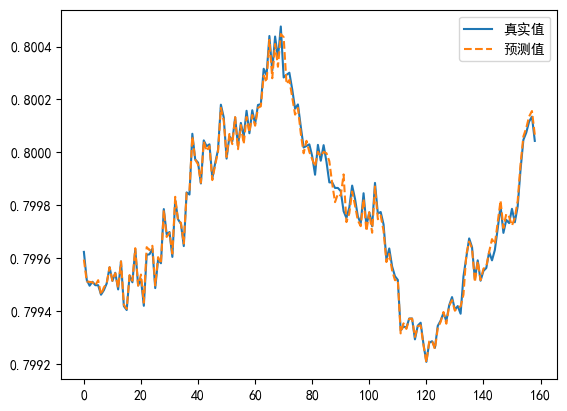

In [45]:
result11 = sl8_prediction(x5, 143)
rmse5 = np.sqrt(np.mean((y5 - result11) ** 2)) # 全集
plt.plot(y5, label="真实值", linestyle='-')
plt.plot(result11, label="预测值",  linestyle='--')
plt.legend()
print(f'全集上均方误差:{rmse5}')
result70 = Best_1.predict(scaler6.transform(x_5bc))*scaler10.scale_[-1]+scaler10.mean_[-1]
result71 = Best_2.predict(scaler7.transform(x_5pc))*scaler11.scale_[-1]+scaler11.mean_[-1]
rmse_ceshi5 = np.sqrt(1/len(y5)*(sum(( y_5bc.values.ravel()- result70) ** 2)+sum(( y_5pc.values.ravel()- result71) ** 2)))
print(f'测试集上均方误差,:{rmse_ceshi5}')

全集上均方误差:3.621720359122973e-05
测试集上均方误差,:1.9162840532725897e-05


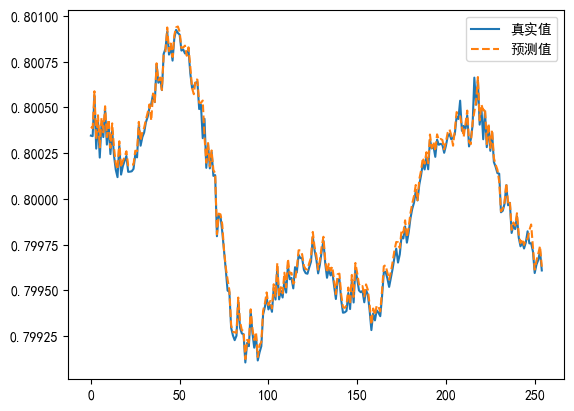

In [46]:
result12 = sl8_prediction(x6, 43)
rmse6 = np.sqrt(np.mean((y6 - result12) ** 2)) # 全集
plt.plot(y6, label="真实值", linestyle='-')
plt.plot(result12, label="预测值",  linestyle='--')
plt.legend()
print(f'全集上均方误差:{rmse6}')
result80 = Best_1.predict(scaler6.transform(x_6bc))*scaler10.scale_[-1]+scaler10.mean_[-1]
result81 = Best_2.predict(scaler7.transform(x_6pc))*scaler11.scale_[-1]+scaler11.mean_[-1]
rmse_ceshi6 = np.sqrt(1/len(y6)*(sum(( y_6bc.values.ravel()- result80) ** 2)+sum(( y_6pc.values.ravel()- result81) ** 2)))
print(f'测试集上均方误差,:{rmse_ceshi6}')

全集上均方误差:2.68509422535089e-05
测试集上均方误差,:1.8918849184688995e-05


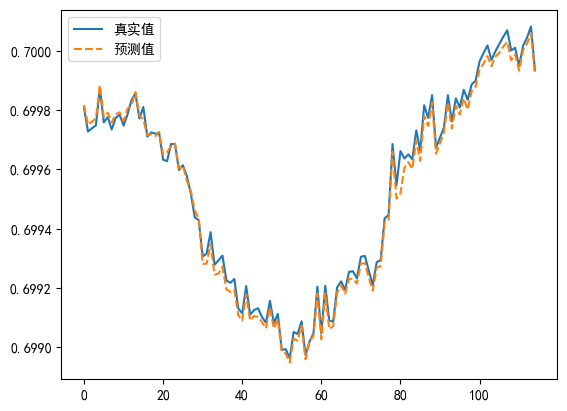

In [47]:
result7 = sl7_prediction(x1,30)
rmse1 = np.sqrt(np.mean((y1 - result7) ** 2)) # 全集
plt.plot(y1, label="真实值", linestyle='-')
plt.plot(result7, label="预测值",  linestyle='--')
plt.legend()
print(f'全集上均方误差:{rmse1}')
result90 = Best_3.predict(scaler8.transform(x_1bc))*scaler12.scale_[-1]+scaler12.mean_[-1]
result91 = Best_4.predict(scaler9.transform(x_1pc))*scaler13.scale_[-1]+scaler13.mean_[-1]
rmse_ceshi1 = np.sqrt((1/len(y1))*(sum(( y_1bc.values.ravel()- result90) ** 2)+sum(( y_1pc.values.ravel()- result91) ** 2)))
print(f'测试集上均方误差,:{rmse_ceshi1}')

全集上均方误差:1.974406283416294e-05
测试集上均方误差,:1.2130169646318785e-05


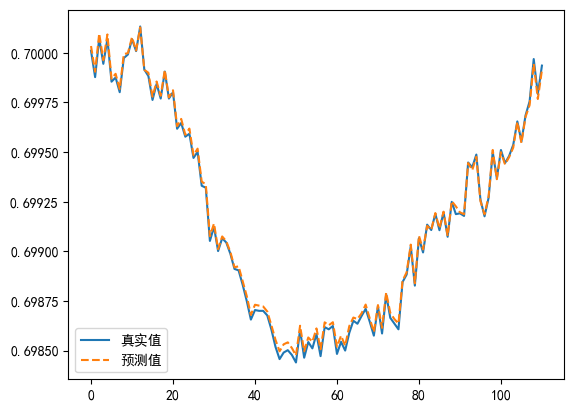

In [48]:
result8 = sl7_prediction(x2,30)
rmse2 = np.sqrt(np.mean((y2 - result8) ** 2)) # 全集
plt.plot(y2, label="真实值", linestyle='-')
plt.plot(result8, label="预测值",  linestyle='--')
plt.legend()
print(f'全集上均方误差:{rmse2}')
result100 = Best_3.predict(scaler8.transform(x_2bc))*scaler12.scale_[-1]+scaler12.mean_[-1]
result101 = Best_4.predict(scaler9.transform(x_2pc))*scaler13.scale_[-1]+scaler13.mean_[-1]
rmse_ceshi2 = np.sqrt((1/len(y2))*(sum(( y_2bc.values.ravel()- result100) ** 2)+sum(( y_2pc.values.ravel()- result101) ** 2)))
print(f'测试集上均方误差,:{rmse_ceshi2}')

全集上均方误差:1.3972386062413848e-05
测试集上均方误差,:8.168557013655654e-06


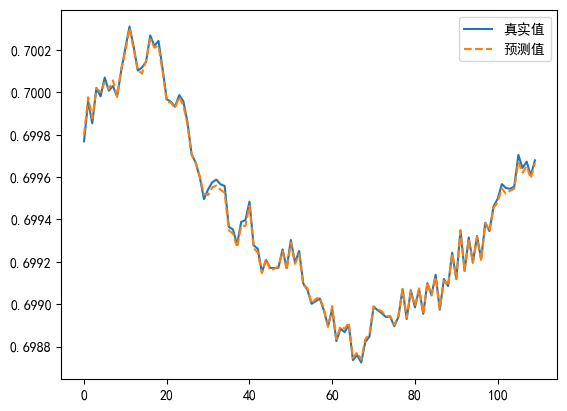

In [49]:
result9 = sl7_prediction(x3,30)
rmse3 = np.sqrt(np.mean((y3 - result9) ** 2)) # 全集
plt.plot(y3, label="真实值", linestyle='-')
plt.plot(result9, label="预测值",  linestyle='--')
plt.legend()
print(f'全集上均方误差:{rmse3}')
result110 = Best_3.predict(scaler8.transform(x_3bc))*scaler12.scale_[-1]+scaler12.mean_[-1]
result111 = Best_4.predict(scaler9.transform(x_3pc))*scaler13.scale_[-1]+scaler13.mean_[-1]
rmse_ceshi3 = np.sqrt((1/len(y3))*(sum(( y_3bc.values.ravel()- result110) ** 2)+sum(( y_3pc.values.ravel()- result111) ** 2)))
print(f'测试集上均方误差,:{rmse_ceshi3}')

全集上均方误差:1.648008897493124e-05
测试集上均方误差,:7.09366140650162e-06


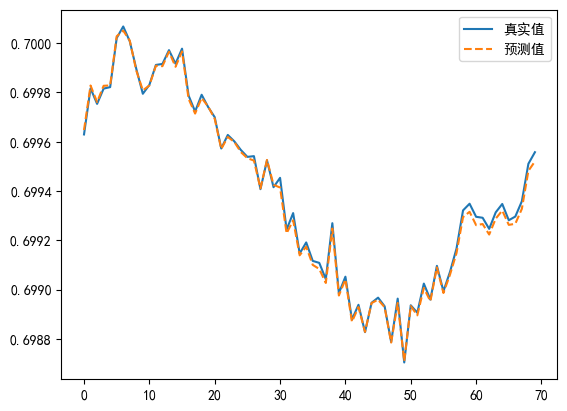

In [50]:
result10 = sl7_prediction(x4,30)
rmse4 = np.sqrt(np.mean((y4 - result10) ** 2)) # 全集
plt.plot(y4, label="真实值", linestyle='-')
plt.plot(result10, label="预测值",  linestyle='--')
plt.legend()
print(f'全集上均方误差:{rmse4}')
result120 = Best_3.predict(scaler8.transform(x_4bc))*scaler12.scale_[-1]+scaler12.mean_[-1]
result121 = Best_4.predict(scaler9.transform(x_4pc))*scaler13.scale_[-1]+scaler13.mean_[-1]
rmse_ceshi4 = np.sqrt((1/len(y4))*(sum(( y_4bc.values.ravel()- result120) ** 2)+sum(( y_4pc.values.ravel()- result121) ** 2)))
print(f'测试集上均方误差,:{rmse_ceshi4}')

对比试验1 SVR

In [51]:
y1

,6
0,0.699808
1,0.699728
2,0.699739
3,0.699749
4,0.699873
...,...
110,0.699949
111,0.700018
112,0.700045
113,0.700083


In [ ]:

def duibi(x, y):
    s1 = StandardScaler()
    s2 = StandardScaler()
    x_train ,x_test,y_train, y_test =  train_test_split(x, y,test_size=0.3, random_state=88888)
    x_test = s1.fit_transform(x_test)
    x_std = s1.transform(x)
    x_train = s1.transform(x_train)
    y_train = s2.fit_transform(y_train).ravel()
    Y_test = s2.transform(y_test)
    svm_db = SVR()
    svm_db.fit(x_train, y_train)
    print(svm_db.score(x_test, Y_test))
    result = svm_db.predict(x_std)*s2.scale_[-1] +s2.mean_[-1]
    plt.plot(result)
    plt.plot(y)
    r1 = svm_db.predict(x_test)*s2.scale_[-1] +s2.mean_[-1]
    rmse = np.sqrt(np.mean((y_test. ravel()-r1)**2))
    print(f'测试集: {rmse}')
    return result 

0.984052743350893
测试集: 5.297713834778196e-05


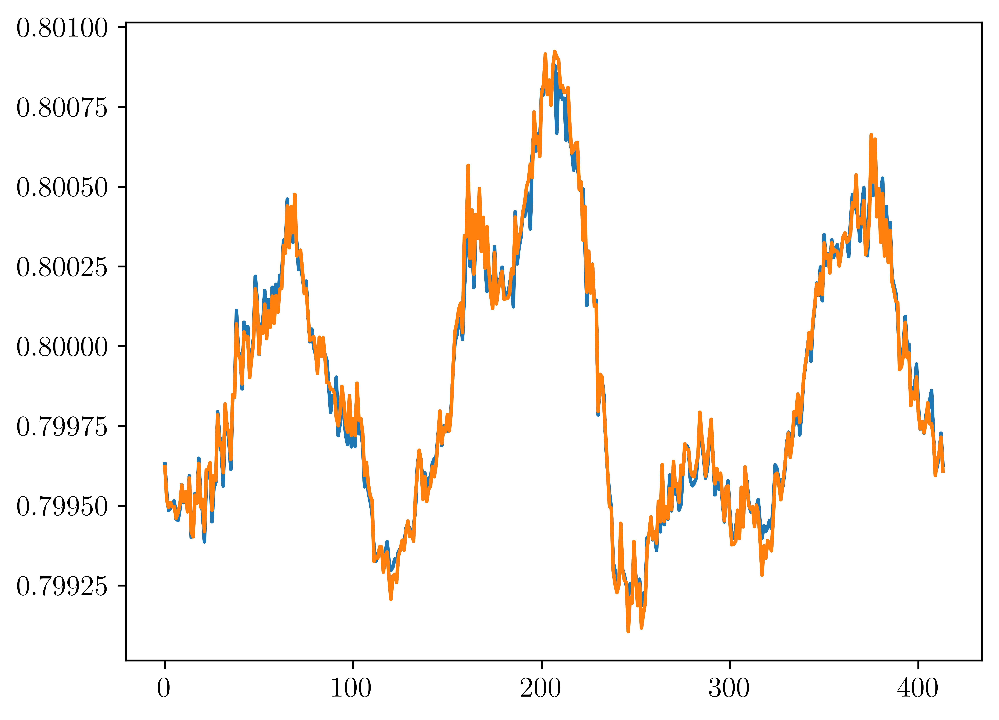

In [518]:
x_combined = pd.concat([x5, x6], axis=0).values
y_combined = pd.concat([y5, y6], axis=0).values
result_svm = duibi(x_combined, y_combined)

In [473]:
len(result_svm)

414

0.9848979669948998
测试集: 3.9655300286055596e-05


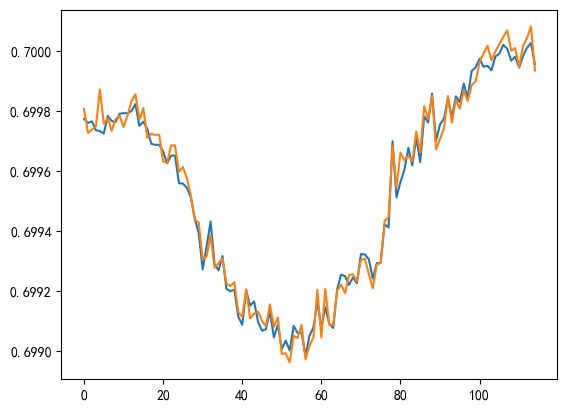

In [53]:
result13 = duibi(x1,y1)


0.963194850133683
测试集: 9.46308053118912e-05


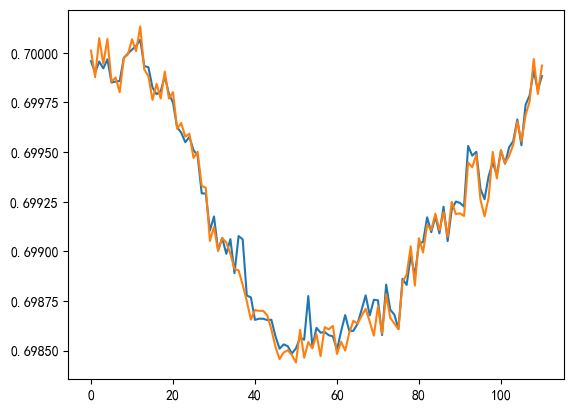

In [54]:
result14 = duibi(x2,y2)

0.965707612112545
测试集: 6.792564392858558e-05


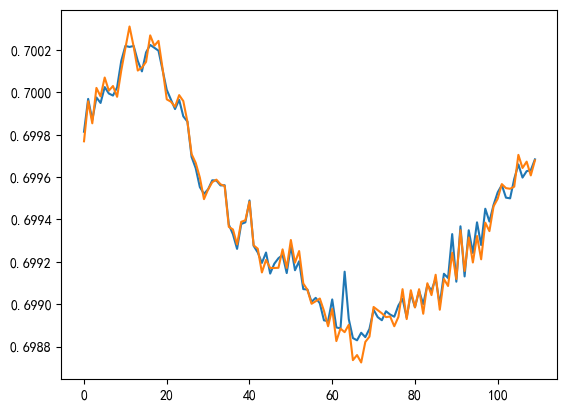

In [55]:
result15 = duibi(x3,y3)

0.9743816080767355
测试集: 5.9287053185003734e-05


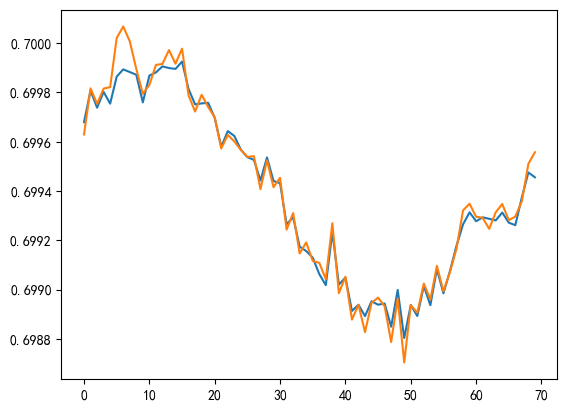

In [56]:
result16 = duibi(x4,y4)

0.9323688948476725
测试集: 8.207627707362657e-05


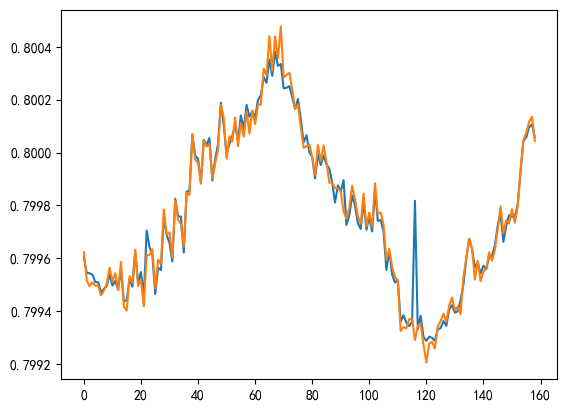

In [57]:
result17 = duibi(x5,y5)

0.9864565082503884
测试集: 5.011325412382513e-05


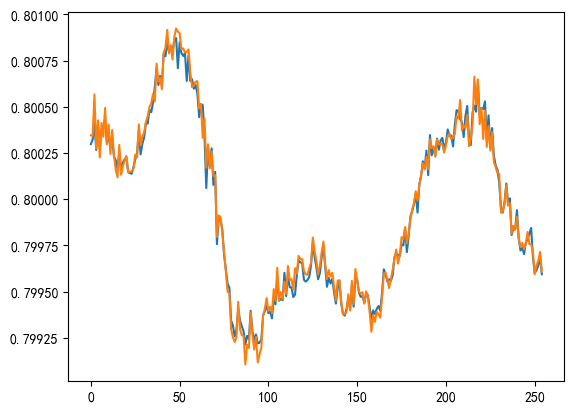

In [58]:
result18 = duibi(x6,y6)

In [59]:
import pandas as pd
result_1 = np.array(result1).flatten()
result_2 = np.array(result2).flatten()
result_3 = np.array(result3).flatten()
result_4 = np.array(result4).flatten()
result_5 = np.array(result5).flatten()
result_6 = np.array(result6).flatten()
result_7 = np.array(result7).flatten()
result_8 = np.array(result8).flatten()
result_9 = np.array(result9).flatten()
result_10 = np.array(result10).flatten()
result_11 = np.array(result11).flatten()
result_12 = np.array(result12).flatten()
result_13 = np.array(result13).flatten()
result_14 = np.array(result14).flatten()
result_15 = np.array(result15).flatten()
result_16 = np.array(result16).flatten()
result_17 = np.array(result17).flatten()
result_18 = np.array(result18).flatten()



y11 = y1[6].tolist()
y22 = y2[6].tolist()
y33 = y3[6].tolist()
y44 = y4[6].tolist()
y55 = y5[6].tolist()
y66 = y6[6].tolist()


assert len(y11) == len(result_1) , "y1和result_1长度不一致"
assert len(y22) == len(result_2), "y2和result_2长度不一致"
assert len(y33) == len(result_3), "y3和result_3长度不一致"
assert len(y44) == len(result_4), "y4和result_4长度不一致"
assert len(y55) == len(result_5), "y5和result_5长度不一致"
assert len(y66) == len(result_6), "y6和result_6长度不一致"


max_length = max(len(y11), len(y22), len(y33), len(y44), len(y55), len(y66))

# 定义填充函数
def pad_data(data, target_length):
    return list(data) + [np.nan] * (target_length - len(data))

# 统一所有列的长度
data_res = {
    'y1': pad_data(y11, max_length),
    'result_1': pad_data(result_1, max_length),
    'result_7': pad_data(result_7, max_length),
    'result_13': pad_data(result_13, max_length),
    'y2': pad_data(y22, max_length),
    'result_2': pad_data(result_2, max_length),
    'result_8': pad_data(result_8, max_length),
    'result_14': pad_data(result_14, max_length),
    'y3': pad_data(y33, max_length),
    'result_3': pad_data(result_3, max_length),
    'result_9': pad_data(result_9, max_length),
    'result_15': pad_data(result_15, max_length),
    'y4': pad_data(y44, max_length),
    'result_4': pad_data(result_4, max_length),
    'result_10': pad_data(result_10, max_length),
    'result_16': pad_data(result_16, max_length),
    'y5': pad_data(y55, max_length),
    'result_5': pad_data(result_5, max_length),
    'result_11': pad_data(result_11, max_length),
    'result_17': pad_data(result_17, max_length),
    'y6': pad_data(y66, max_length),
    'result_6': pad_data(result_6, max_length),
    'result_12': pad_data(result_12, max_length),
    'result_18': pad_data(result_18, max_length)

}

# 生成DataFrame
df = pd.DataFrame(data_res)
df.to_excel('mul_output.xlsx', index=False)

对比2，lstm

对比试验2 3 lstm 和 pls svr 

In [480]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import StandardScaler


class CustomLSTMCell(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(CustomLSTMCell, self).__init__()
        self.hidden_size = hidden_size
        self.W_f = nn.Linear(input_size + hidden_size, hidden_size)  
        self.W_i = nn.Linear(input_size + hidden_size, hidden_size)  
        self.W_c = nn.Linear(input_size + hidden_size, hidden_size)  
        self.W_o = nn.Linear(input_size + hidden_size, hidden_size)  

    def forward(self, x, hidden):
        h_prev, c_prev = hidden
        combined = torch.cat((x, h_prev), dim=1) 
        f_t = torch.sigmoid(self.W_f(combined))  
        i_t = torch.sigmoid(self.W_i(combined)) 
        c_tilde_t = torch.tanh(self.W_c(combined)) 
        c_t = f_t * c_prev + i_t * c_tilde_t  
        o_t = torch.sigmoid(self.W_o(combined))  
        h_t = o_t * torch.tanh(c_t)  
        return h_t, c_t

    def init_hidden(self, batch_size):
        return (torch.zeros(batch_size, self.hidden_size),
                torch.zeros(batch_size, self.hidden_size))


class CustomLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(CustomLSTM, self).__init__()
        self.hidden_size = hidden_size
        self.lstm_cell = CustomLSTMCell(input_size, hidden_size)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        batch_size, seq_len, _ = x.size()
        hidden = self.lstm_cell.init_hidden(batch_size)
        outputs = []
        for t in range(seq_len):
            hidden = self.lstm_cell(x[:, t, :], hidden)  
            outputs.append(hidden[0]) 
        outputs = torch.stack(outputs, dim=1)
        outputs = self.fc(outputs)
        return outputs

In [537]:
def duibi2(x, y):
    s1 = StandardScaler()
    s2 = StandardScaler()
    x = x.values
    y = y.values
    torch.set_printoptions(precision=6)
    # 将数据转换为tensor类型
    x = torch.tensor(x, dtype=torch.float32)
    y = torch.tensor(y, dtype=torch.float32)

    # 划分训练集和测试集
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1888)
    
    # 对数据进行标准化
    x_train = s1.fit_transform(x_train)
    x_test = s1.transform(x_test)
    x_std = s1.transform(x)  # 对整个数据进行标准化
    
    y_train = s2.fit_transform(y_train.reshape(-1, 1)).ravel()  # reshape为二维后进行标准化
    Y_test = s2.transform(y_test.reshape(-1, 1))

    # 转换标准化后的数据为tensor
    x_train = torch.tensor(x_train, dtype=torch.float32)
    x_test = torch.tensor(x_test, dtype=torch.float32)
    x_std = torch.tensor(x_std, dtype=torch.float32)
    
    y_train = torch.tensor(y_train, dtype=torch.float32)
    Y_test = torch.tensor(Y_test, dtype=torch.float32)
    
    x_train = x_train.unsqueeze(1)
    x_test = x_test.unsqueeze(1)
    x_std = x_std.unsqueeze(1)
    
    # 定义模型、损失函数和优化器
    m_lstm = CustomLSTM(6, 15, 1)  # 根据输入数据的维度调整输入参数
    criterion = nn.MSELoss()
    optimizer = optim.Adam(m_lstm.parameters(), lr=0.01)

    # 训练模型
    for epoch in range(100):
        m_lstm.train()
        optimizer.zero_grad()
        outputs_train = m_lstm(x_train).squeeze()
        loss = criterion(outputs_train, y_train)
        loss.backward()
        optimizer.step()

    # 测试模型
    m_lstm.eval()
    with torch.no_grad():
        output = m_lstm(x_test).squeeze()
        outputs = m_lstm(x_std).squeeze()

    # 反标准化结果
    results = outputs * s2.scale_[-1] + s2.mean_[-1]
    
    r1 = output * s2.scale_[-1] + s2.mean_[-1]
    rmse1 = torch.sqrt(torch.mean((y_test - r1) ** 2))
    rmse2 = torch.sqrt(torch.mean((y - results) ** 2))

    print(f'测试集: {rmse1}')
    print(f'全集: {rmse2}')
    return results,r1,y_test 


In [541]:
[result_lstm1, r1_lstm1, ytest_lstm1] = duibi2(x1, y1)
[result_lstm2, r1_lstm2, ytest_lstm2] = duibi2(x2, y2)
[result_lstm3, r1_lstm3, ytest_lstm3] = duibi2(x3, y3)
[result_lstm4, r1_lstm4, ytest_lstm4] = duibi2(x4, y4)
[result_lstm5, r1_lstm5, ytest_lstm5] = duibi2(x5, y5)
[result_lstm6, r1_lstm6, ytest_lstm6] = duibi2(x6, y6)

result_lstm1 = np.array(result_lstm1).flatten()
result_lstm2 = np.array(result_lstm2).flatten()
result_lstm3 = np.array(result_lstm3).flatten()
result_lstm4 = np.array(result_lstm4).flatten()
result_lstm5 = np.array(result_lstm5).flatten()
result_lstm6 = np.array(result_lstm6).flatten()
r1_lstm1 = np.array(r1_lstm1).flatten()
r1_lstm2 = np.array(r1_lstm2).flatten()
r1_lstm3 = np.array(r1_lstm3).flatten()
r1_lstm4 = np.array(r1_lstm4).flatten()
r1_lstm5 = np.array(r1_lstm5).flatten()
r1_lstm6 = np.array(r1_lstm6).flatten()
ytest_lstm1 = np.array(ytest_lstm1).flatten()
ytest_lstm2 = np.array(ytest_lstm2).flatten()
ytest_lstm3 = np.array(ytest_lstm3).flatten()
ytest_lstm4 = np.array(ytest_lstm4).flatten()
ytest_lstm5 = np.array(ytest_lstm5).flatten()
ytest_lstm6 = np.array(ytest_lstm6).flatten()


y11 = y1[6].tolist()
y22 = y2[6].tolist()
y33 = y3[6].tolist()
y44 = y4[6].tolist()
y55 = y5[6].tolist()
y66 = y6[6].tolist()





max_length = max(len(y11), len(y22), len(y33), len(y44), len(y55), len(y66))

# 定义填充函数
def pad_data(data, target_length):
    return list(data) + [np.nan] * (target_length - len(data))

# 统一所有列的长度
data_res = {
    'result_lstm1': pad_data(result_lstm1, max_length),
    'y1': pad_data(y11, max_length),
    'r1_lstm1': pad_data(r1_lstm1, max_length),
    'y_test_lstm1': pad_data(ytest_lstm1, max_length),
    'result_lstm2': pad_data(result_lstm2, max_length),
    'y2': pad_data(y22, max_length),
    'r1_lstm2': pad_data(r1_lstm2, max_length),
    'y_test_lstm2': pad_data(ytest_lstm2, max_length),
    'result_lstm3': pad_data(result_lstm3, max_length),
    'y3': pad_data(y33, max_length),
    'r1_lstm3': pad_data(r1_lstm3, max_length),
    'y_test_lstm3': pad_data(ytest_lstm3, max_length),
    'result_lstm4': pad_data(result_lstm4, max_length),
    'y4': pad_data(y44, max_length),
    'r1_lstm4': pad_data(r1_lstm4, max_length),
    'y_test_lstm4': pad_data(ytest_lstm4, max_length),
    'result_lstm5': pad_data(result_lstm5, max_length),
    'y5': pad_data(y55, max_length),
    'r1_lstm5': pad_data(r1_lstm5, max_length),
    'y_test_lstm5': pad_data(ytest_lstm5, max_length),
    'result_lstm6': pad_data(result_lstm6, max_length),
    'y6': pad_data(y66, max_length),
    'r1_lstm6': pad_data(r1_lstm6, max_length),
    'y_test_lstm6': pad_data(ytest_lstm6, max_length)

}

# 生成DataFrame
df = pd.DataFrame(data_res)
df.to_excel('lstmdb.xlsx', index=False)

测试集: 0.00044073350727558136
全集: 0.0004666355671361089
测试集: 0.0006813136860728264
全集: 0.0007305089384317398
测试集: 0.0005687111406587064
全集: 0.0006082961335778236
测试集: 0.0005057225935161114
全集: 0.0005127775948494673
测试集: 0.00041400326881557703
全集: 0.0004122652462683618
测试集: 0.0006549199461005628
全集: 0.0006554101128131151


测试集: 0.0005975085077807307
全集: 0.0005892507033422589


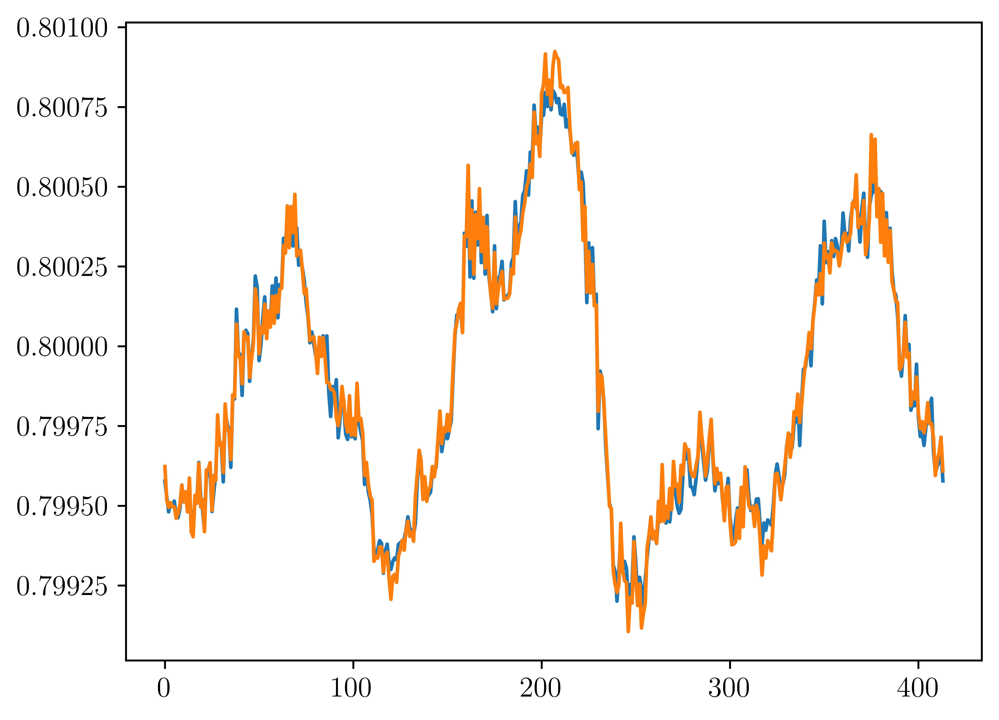

In [529]:
x_combined = pd.concat([x5, x6], axis=0)
y_combined = pd.concat([y5, y6], axis=0)
result_lstm = duibi2(x_combined, y_combined)
y_combined = pd.concat([y5, y6], axis=0).values

In [516]:
def duibi3(x, y):
    s1 = StandardScaler()
    s2 = StandardScaler()
    x_train ,x_test,y_train, y_test =  train_test_split(x, y,test_size=0.3, random_state=1688)
    x_train = s1.fit_transform(x_train)
    x_std = s1.transform(x)
    x_test = s1.transform(x_test)
    y_train = s2.fit_transform(y_train).ravel()
    Y_test = s2.transform(y_test)
    pls = PLSRegression(n_components=2)
    pls.fit(x_train, y_train)
    print(pls.score(x_test, Y_test))
    result = pls.predict(x_std)*s2.scale_[-1] +s2.mean_[-1]
    plt.plot(result)
    plt.plot(y)
    r1 = pls.predict(x_test)*s2.scale_[-1] +s2.mean_[-1]
    rmse = np.sqrt(np.mean((y_test.ravel()- r1)**2))
    print(f'测试集: {rmse}')
    return result

0.9932545418467256
测试集: 3.246138933642154e-05


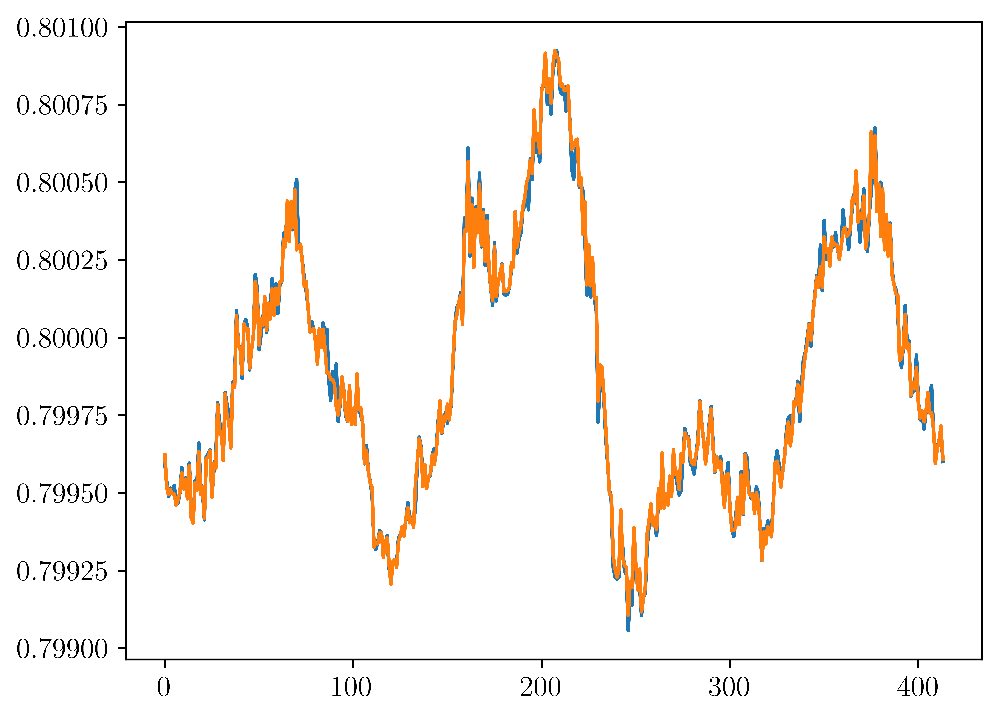

In [517]:
x_combined = pd.concat([x5, x6], axis=0).values
y_combined = pd.concat([y5, y6], axis=0).values
result_pls = duibi3(x_combined, y_combined)

In [515]:
result_lstm = np.array(result_lstm).flatten()
result_pls = np.array(result_pls).flatten()
result_svm = np.array(result_svm).flatten()

ycombined = y_combined.ravel()



max_length = max(len(ycombined), len(result_lstm), len(result_pls), len(result_svm))

# 定义填充函数
def pad_data(data, target_length):
    return list(data) + [np.nan] * (target_length - len(data))

# 统一所有列的长度
data_res = {
    'result_lstm': pad_data(result_lstm, max_length),
    'result_pls': pad_data(result_pls, max_length),
    'result_svm': pad_data(result_svm, max_length),
    'ycombined': pad_data(ycombined, max_length)

}

# 生成DataFrame
df = pd.DataFrame(data_res)
df.to_excel('output_dblstm1.xlsx', index=False)

0.9897054039928409
测试集: 3.132428127349347e-05


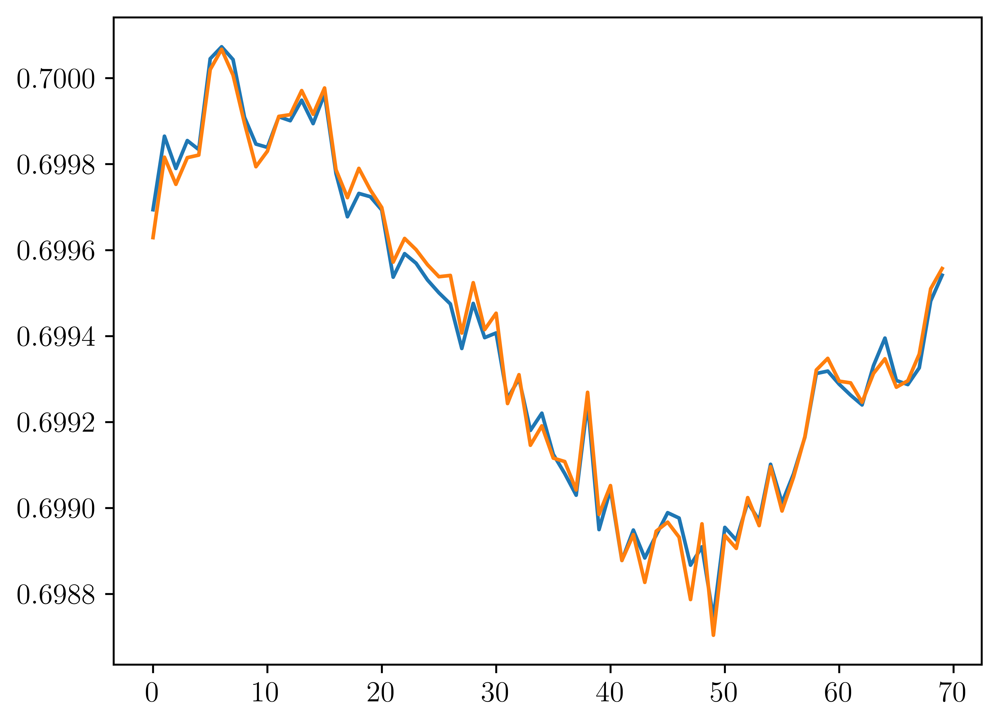

In [439]:
result19 = duibi3(x4,y4)

0.963536608254116
测试集: 6.051953157809588e-05


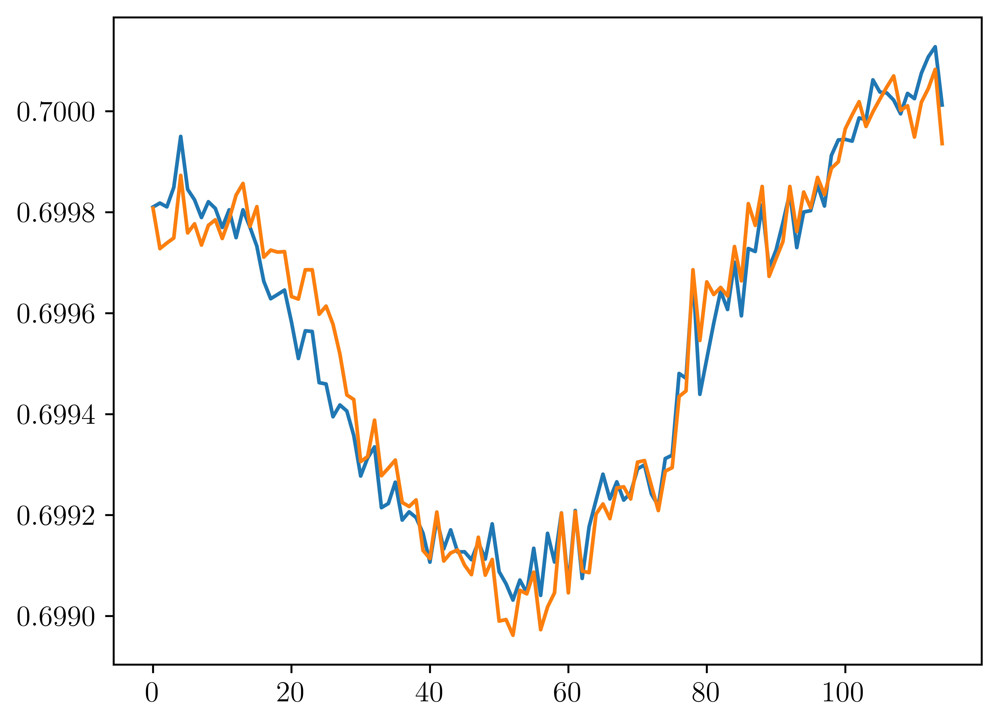

In [450]:
result19 = duibi3(x1,y1)

0.9901423735080199
测试集: 4.365533534121293e-05


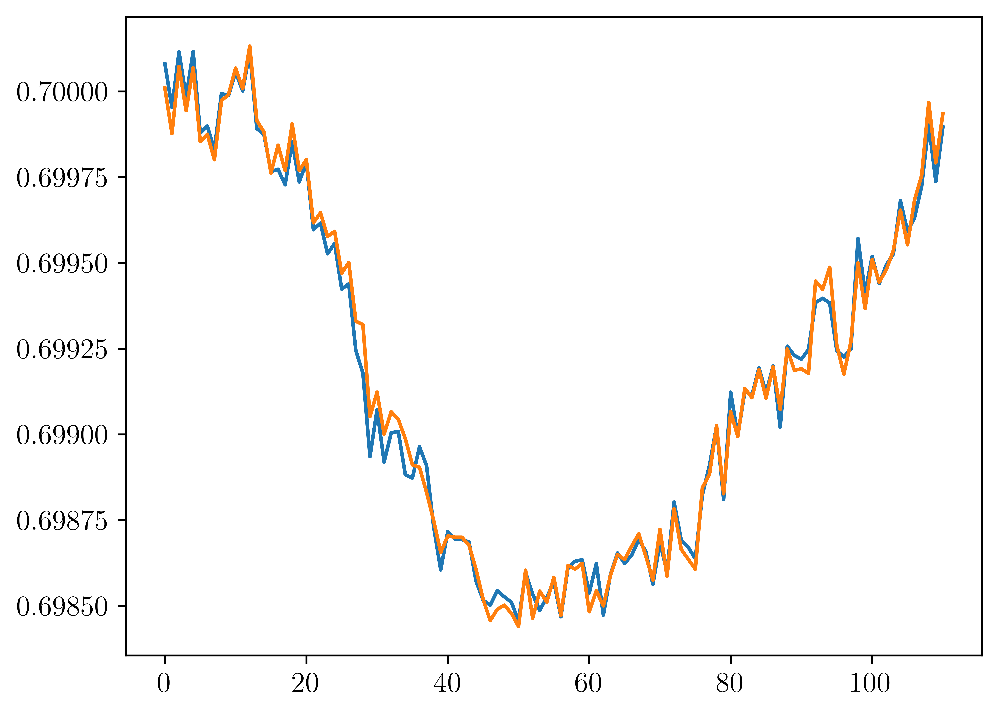

In [451]:
result20 = duibi3(x2,y2)

0.9973568055670884
测试集: 1.972303672146939e-05


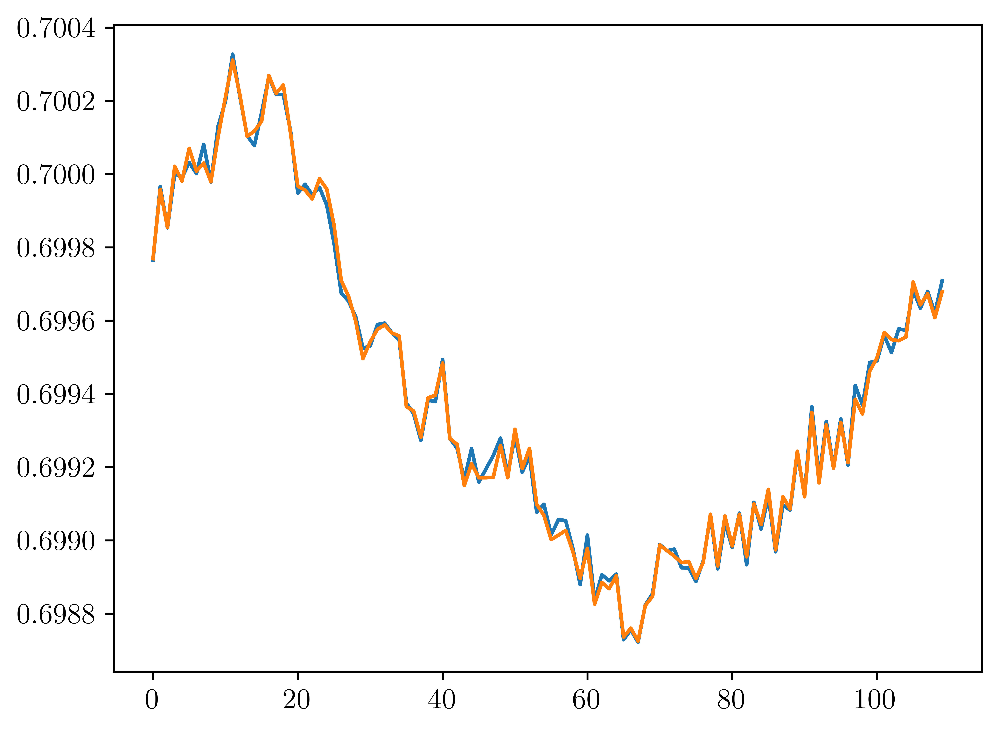

In [452]:
result21 = duibi3(x3,y3)

0.9897054039928409
测试集: 3.65130043263701e-05


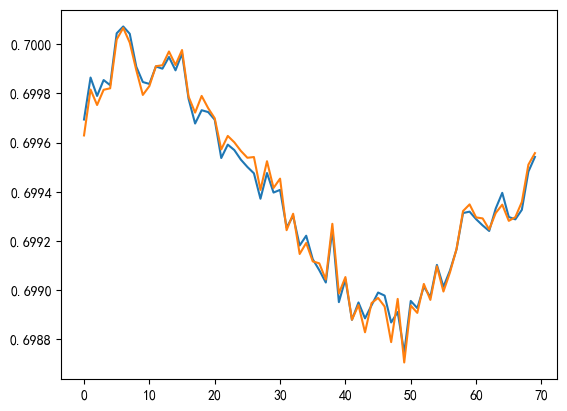

In [68]:
result22 = duibi3(x4,y4)

In [69]:
x5

,0,1,2,3,4,5
0,381.420329,381.212128,99266.97656,65031.97656,0.000000,0.000081
1,381.340623,381.272736,99262.83594,65034.46875,-0.000009,0.000373
2,381.492279,381.272736,99259.25000,65032.91797,-0.000841,0.000067
3,381.400994,381.333344,99258.98438,65032.44922,-0.006263,-0.000195
4,381.446046,381.303040,99263.77344,65036.45703,-0.006263,-0.000195
...,...,...,...,...,...,...
154,381.409870,381.393951,99279.01563,65010.92578,-4.000000,-0.000009
155,381.329627,381.484863,99278.78125,65008.64453,-4.000000,0.000508
156,381.429363,381.393951,99279.46875,65006.30078,-4.000000,0.000139
157,381.422175,381.393951,99286.31250,65009.53906,-4.000000,0.000139


0.9925509632678505
测试集: 2.5907633822060294e-05


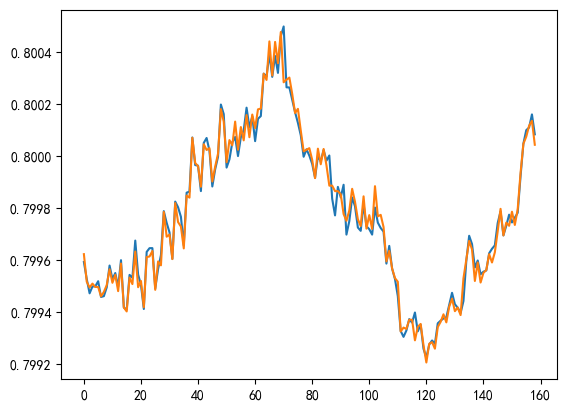

In [70]:
result23 = duibi3(x5,y5)

0.9948044442624521
测试集: 3.352815582440857e-05


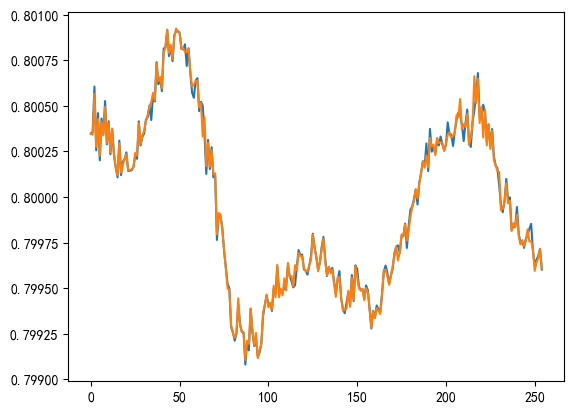

In [71]:
result24 = duibi3(x6,y6)

In [72]:
result_1 = np.array(result1).flatten()
result_2 = np.array(result2).flatten()
result_3 = np.array(result3).flatten()
result_4 = np.array(result4).flatten()
result_5 = np.array(result5).flatten()
result_6 = np.array(result6).flatten()
result_7 = np.array(result7).flatten()
result_8 = np.array(result8).flatten()
result_9 = np.array(result9).flatten()
result_10 = np.array(result10).flatten()
result_11 = np.array(result11).flatten()
result_12 = np.array(result12).flatten()
result_13 = np.array(result13).flatten()
result_14 = np.array(result14).flatten()
result_15 = np.array(result15).flatten()
result_16 = np.array(result16).flatten()
result_17 = np.array(result17).flatten()
result_18 = np.array(result18).flatten()
result_19 = np.array(result19).flatten()
result_20 = np.array(result20).flatten()
result_21 = np.array(result21).flatten()
result_22 = np.array(result22).flatten()
result_23 = np.array(result23).flatten()
result_24 = np.array(result24).flatten()



y11 = y1[6].tolist()
y22 = y2[6].tolist()
y33 = y3[6].tolist()
y44 = y4[6].tolist()
y55 = y5[6].tolist()
y66 = y6[6].tolist()


assert len(y11) == len(result_1) , "y1和result_1长度不一致"
assert len(y22) == len(result_2), "y2和result_2长度不一致"
assert len(y33) == len(result_3), "y3和result_3长度不一致"
assert len(y44) == len(result_4), "y4和result_4长度不一致"
assert len(y55) == len(result_5), "y5和result_5长度不一致"
assert len(y66) == len(result_6), "y6和result_6长度不一致"


max_length = max(len(y11), len(y22), len(y33), len(y44), len(y55), len(y66))

# 定义填充函数
def pad_data(data, target_length):
    return list(data) + [np.nan] * (target_length - len(data))

# 统一所有列的长度
data_res = {
    'y1': pad_data(y11, max_length),
    'result_1': pad_data(result_1, max_length),
    'result_7': pad_data(result_7, max_length),
    'result_13': pad_data(result_13, max_length),
    'result_19': pad_data(result_19, max_length),
    'y2': pad_data(y22, max_length),
    'result_2': pad_data(result_2, max_length),
    'result_8': pad_data(result_8, max_length),
    'result_14': pad_data(result_14, max_length),
    'result_20': pad_data(result_20, max_length),
    'y3': pad_data(y33, max_length),
    'result_3': pad_data(result_3, max_length),
    'result_9': pad_data(result_9, max_length),
    'result_15': pad_data(result_15, max_length),
    'result_21': pad_data(result_21, max_length),
    'y4': pad_data(y44, max_length),
    'result_4': pad_data(result_4, max_length),
    'result_10': pad_data(result_10, max_length),
    'result_16': pad_data(result_16, max_length),
    'result_22': pad_data(result_22, max_length),
    'y5': pad_data(y55, max_length),
    'result_5': pad_data(result_5, max_length),
    'result_11': pad_data(result_11, max_length),
    'result_17': pad_data(result_17, max_length),
    'result_23': pad_data(result_23, max_length),
    'y6': pad_data(y66, max_length),
    'result_6': pad_data(result_6, max_length),
    'result_12': pad_data(result_12, max_length),
    'result_18': pad_data(result_18, max_length),
    'result_24': pad_data(result_24, max_length),
}

# 生成DataFrame
df = pd.DataFrame(data_res)
df.to_excel('compare_output.xlsx', index=False)

加入概率框架（高斯过程）

In [399]:
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel
from sklearn.gaussian_process.kernels import Product
from sklearn.gaussian_process.kernels import ConstantKernel as C
import matplotlib.pyplot as plt

def muil_prediction2(x, y,idx_turn = 30):
    s1 = StandardScaler()
    s2 = StandardScaler()
    ret8=[]
    ret9=[]
    X_test = x.iloc[:idx_turn,:]
    x_test = x.iloc[idx_turn:,:]
    X_test1 = (X_test - scaler1.mean_[:6]) / scaler1.scale_[:6]
    X_test2 = (X_test - scaler2.mean_[:6]) / scaler2.scale_[:6]
    x_test1 = (x_test - scaler4.mean_[:6]) / scaler4.scale_[:6]
    x_test2 = (x_test - scaler5.mean_[:6]) / scaler5.scale_[:6]
    G2 = Best_8.predict(X_test1)*scaler1.scale_[-1]+scaler1.mean_[-1]
    G3 = Best_9.predict(X_test2)*scaler2.scale_[-1]+scaler2.mean_[-1]
    g2 = best_8.predict(x_test1)*scaler4.scale_[-1]+scaler4.mean_[-1]
    g3 = best_9.predict(x_test2)*scaler5.scale_[-1]+scaler5.mean_[-1]
        
    for item in G2 :
        ret8.append(np.array([item]))
    for item in G3 :
        ret9.append(np.array([item]))


    for item in g2 :
        ret8.append(np.array([item]))
    for item in g3 :
        ret9.append(np.array([item]))
    retp = np.hstack([ret8,ret9])
    X_train, X_test, y_train, y_test = train_test_split(retp, y, test_size=0.3, random_state=68688)
    X_trains = s1.fit_transform(X_train)
    y_trains = s2.fit_transform(y_train)
    pls = PLSRegression(n_components=2)
    pls.fit(X_trains, y_trains)
    mu_train = pls.predict(X_trains)*s2.scale_[-1]+s2.mean_[-1]
    mu_test = pls.predict(s1.transform(X_test))*s2.scale_[-1]+s2.mean_[-1]
    residual_train = y_train - mu_train
    kernel = RBF(length_scale=1.0, length_scale_bounds=(1e-3, 1e8)) + \
         WhiteKernel(noise_level=0.1, noise_level_bounds=(1e-10, 1e1))
    gp = GaussianProcessRegressor(kernel=kernel,optimizer='fmin_l_bfgs_b',random_state=88
    )
    gp.fit(X_trains, residual_train)
    residual_mean, residual_std = gp.predict(s1.transform(X_test), return_std=True)
    final_mean = mu_test.ravel() + residual_mean
    final_std = residual_std.ravel()
    plt.figure(figsize=(10, 5))
    plt.plot(np.arange(len(final_mean)), y_test, linestyle='-',label='Observations')

    # 1. 绘制最终预测均值
    plt.plot(np.arange(len(final_mean)), mu_test, linestyle='--',label='Mean Prediction')

    # 2. 绘制95%置信区间 (1.96个标准差)
    plt.fill_between(
        np.arange(len(final_mean)),
        final_mean - 1.96 * final_std,
        final_mean + 1.96 * final_std,
        color='red',
        alpha=0.3,
        label='95% CI'
    )

    # 设置图形属性
    plt.title('Gaussian Process Regression')
    plt.legend()
    plt.grid(alpha=0.2)
    plt.tight_layout()
    plt.show()
    return final_mean, final_std

f:\Anaconda3\envs\shumo\lib\site-packages\sklearn\gaussian_process\kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


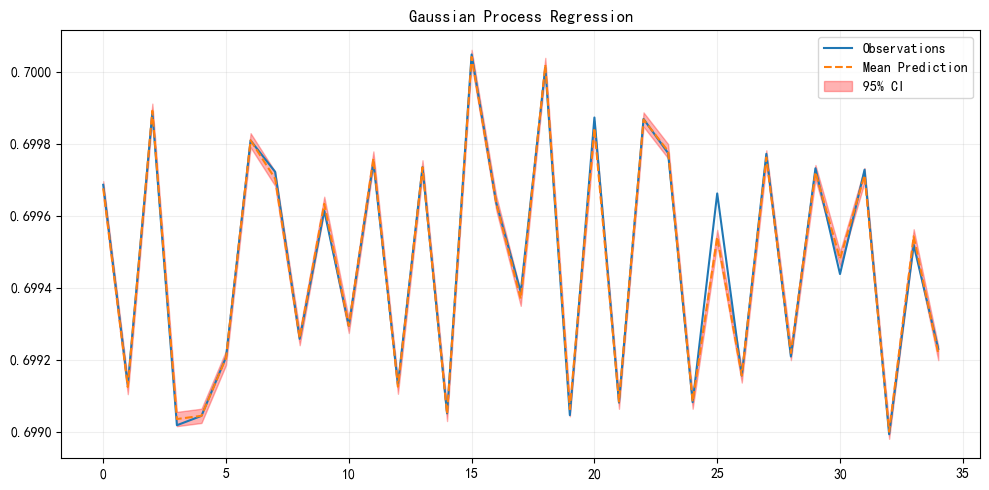

In [400]:
result_gp1 = muil_prediction2(x1, y1, 30)

f:\Anaconda3\envs\shumo\lib\site-packages\sklearn\gaussian_process\_gpr.py:659: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
f:\Anaconda3\envs\shumo\lib\site-packages\sklearn\gaussian_process\kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


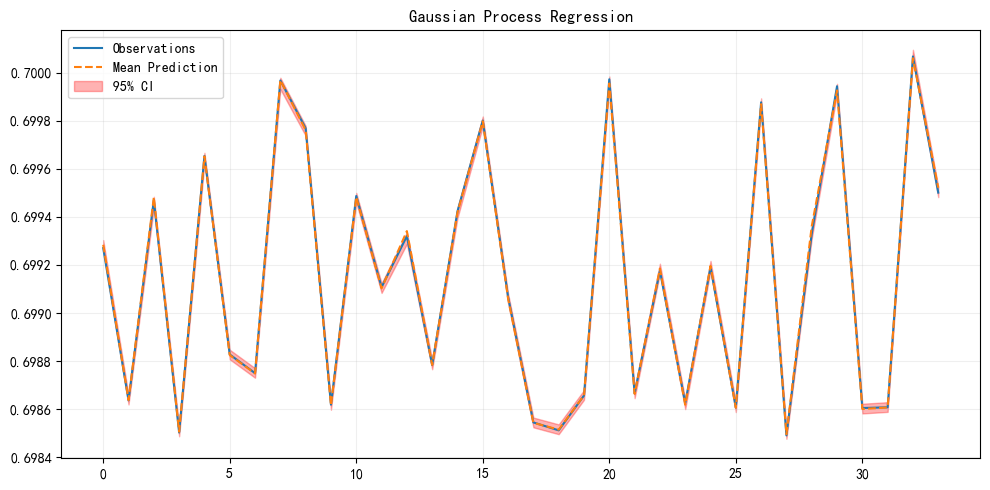

In [401]:
result_gp1 = muil_prediction2(x2, y2, 30)

f:\Anaconda3\envs\shumo\lib\site-packages\sklearn\gaussian_process\kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


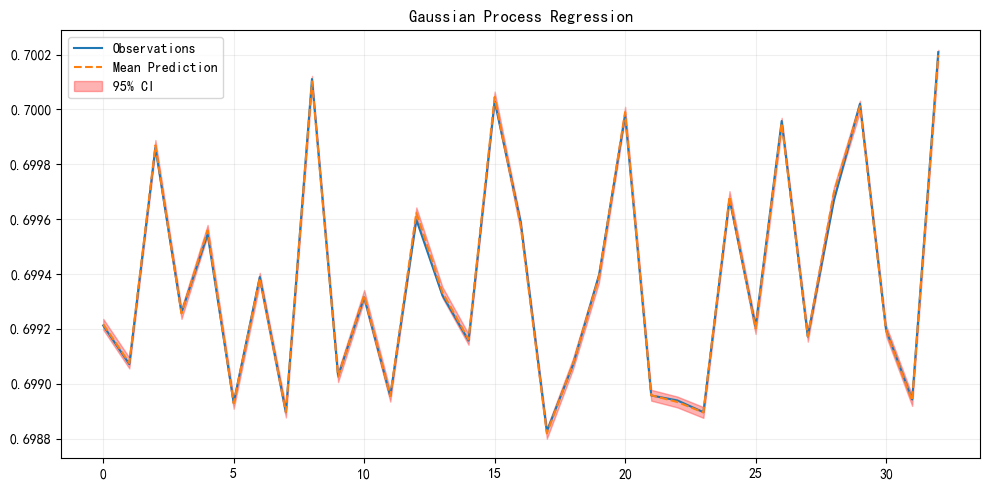

In [402]:
result_gp1 = muil_prediction2(x3, y3,30)

f:\Anaconda3\envs\shumo\lib\site-packages\sklearn\gaussian_process\kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified upper bound 100000000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
f:\Anaconda3\envs\shumo\lib\site-packages\sklearn\gaussian_process\kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


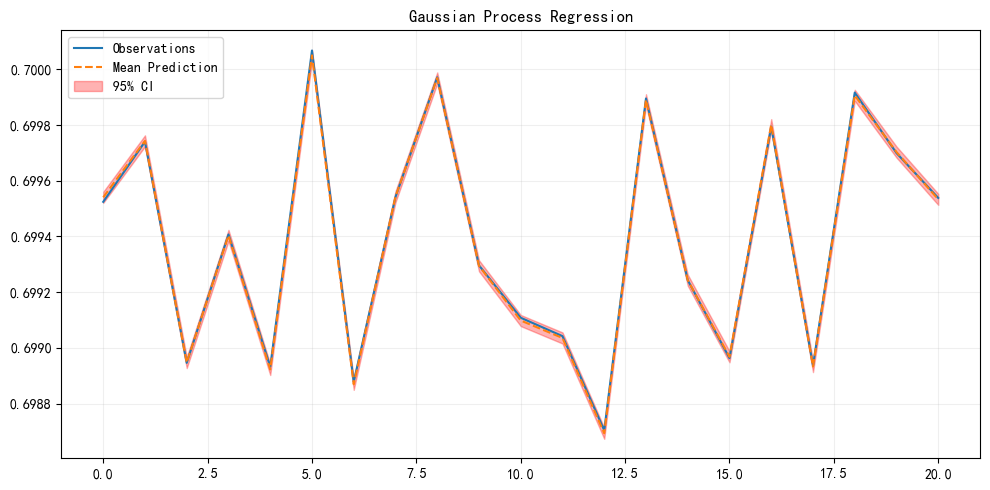

In [403]:
result_gp2 = muil_prediction2(x4, y4, 30)

f:\Anaconda3\envs\shumo\lib\site-packages\sklearn\gaussian_process\kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


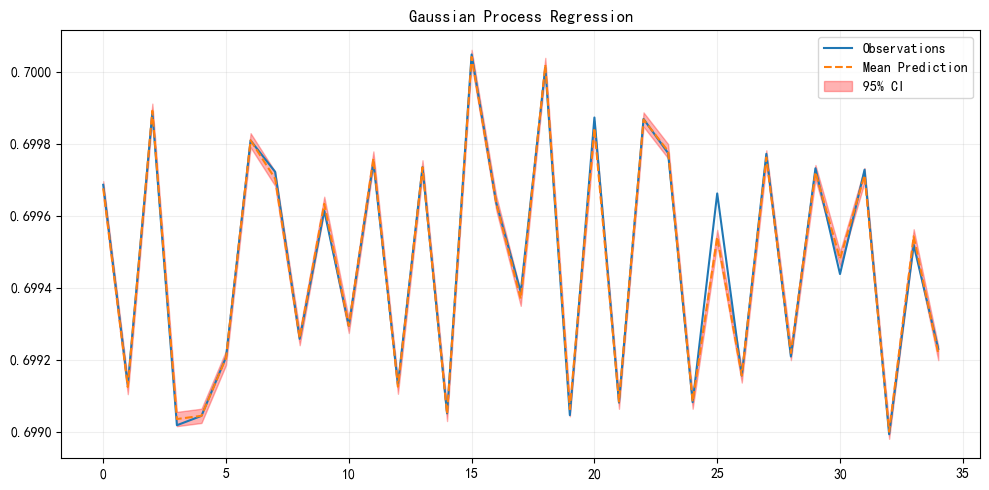

In [404]:
result_gp2 = muil_prediction2(x1, y1, 30)

In [425]:
train5 = []
test5=[]
train_bf = Best_1.predict(scaler6.transform(x_5bx))*scaler10.scale_[-1]+scaler10.mean_[-1]
train_pw = Best_2.predict(scaler7.transform(x_5px))*scaler11.scale_[-1]+scaler11.mean_[-1]
test_bf = Best_1.predict(scaler6.transform(x_5bc))*scaler10.scale_[-1]+scaler10.mean_[-1]
test_pw = Best_2.predict(scaler7.transform(x_5pc))*scaler11.scale_[-1]+scaler11.mean_[-1]
for item in train_bf :
    train5.append(np.array([item]))
for item in train_pw :
    train5.append(np.array([item]))
for item in test_bf :
    test5.append(np.array([item]))
for item in test_pw :
    test5.append(np.array([item]))
mu_train = np.array([item[0] for item in train5])
mu_test = np.array([item[0] for item in test5])
y_train5 = pd.concat([y_5bx, y_5px], axis=0).values.ravel()
residual_train = y_train5 - mu_train
kernel = RBF(length_scale=1.0, length_scale_bounds=(1e-3, 1e8)) + \
    WhiteKernel(noise_level=0.1, noise_level_bounds=(1e-11, 1e1))
gp = GaussianProcessRegressor(kernel=kernel,optimizer='fmin_l_bfgs_b',random_state=88)
gp.fit(pd.concat([x_5bx, x_5px], axis=0), residual_train)
residual_mean, residual_std = gp.predict(pd.concat([x_5bc, x_5pc], axis=0), return_std=True)
final_mean = mu_test + residual_mean
final_std = residual_std.ravel()
plt.figure(figsize=(10, 4.52))
plt.plot(np.arange(len(final_mean)), pd.concat([y_5bc, y_5pc], axis=0).values.ravel(), linestyle='-',label='Observations')

    # 1. 绘制最终预测均值
plt.plot(np.arange(len(final_mean)), mu_test, linestyle='--',label='Mean Prediction')

    # 2. 绘制95%置信区间 (1.96个标准差)
plt.fill_between(
    np.arange(len(final_mean)),
    final_mean - 1.96 * final_std,
    final_mean + 1.96 * final_std,
    color='red',
    alpha=0.3,
    label='95\% CI'
)

    # 设置图形属性
plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()
plt.rcParams.update({
    "text.usetex": True,  # 使用LaTeX渲染文本
    "font.family": "serif",
    "font.serif": ["Times New Roman"],  # 专业字体
    "font.size": 12,
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "figure.dpi": 1200,
})
plt.savefig(
    'professional_quality_plot1.pdf',
    format='pdf',
    dpi=1200,  # 超高质量
)

        


In [426]:
train6 = []
test6=[]
train_bf = Best_1.predict(scaler6.transform(x_6bx))*scaler10.scale_[-1]+scaler10.mean_[-1]
train_pw = Best_2.predict(scaler7.transform(x_6px))*scaler11.scale_[-1]+scaler11.mean_[-1]
test_bf = Best_1.predict(scaler6.transform(x_6bc))*scaler10.scale_[-1]+scaler10.mean_[-1]
test_pw = Best_2.predict(scaler7.transform(x_6pc))*scaler11.scale_[-1]+scaler11.mean_[-1]
for item in train_bf :
    train6.append(np.array([item]))
for item in train_pw :
    train6.append(np.array([item]))
for item in test_bf :
    test6.append(np.array([item]))
for item in test_pw :
    test6.append(np.array([item]))
mu_train = np.array([item[0] for item in train6])
mu_test = np.array([item[0] for item in test6])
y_train6 = pd.concat([y_6bx, y_6px], axis=0).values.ravel()
residual_train = y_train6 - mu_train
kernel = RBF(length_scale=1.0, length_scale_bounds=(1e-3, 1e8)) + \
    WhiteKernel(noise_level=0.1, noise_level_bounds=(1e-11, 1e1))
gp = GaussianProcessRegressor(kernel=kernel,optimizer='fmin_l_bfgs_b',random_state=88)
gp.fit(pd.concat([x_6bx, x_6px], axis=0), residual_train)
residual_mean, residual_std = gp.predict(pd.concat([x_6bc, x_6pc], axis=0), return_std=True)
final_mean = mu_test + residual_mean
final_std = residual_std.ravel()
plt.figure(figsize=(10, 4.52))
plt.plot(np.arange(len(final_mean)), pd.concat([y_6bc, y_6pc], axis=0).values.ravel(), linestyle='-',label='Observations')

    # 1. 绘制最终预测均值
plt.plot(np.arange(len(final_mean)), mu_test, linestyle='--',label='Mean Prediction')

    # 2. 绘制95%置信区间 (1.96个标准差)
plt.fill_between(
    np.arange(len(final_mean)),
    final_mean - 1.96 * final_std,
    final_mean + 1.96 * final_std,
    color='red',
    alpha=0.3,
    label='95\% CI'
)

    # 设置图形属性
plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()
plt.rcParams.update({
    "text.usetex": True,  # 使用LaTeX渲染文本
    "font.family": "serif",
    "font.serif": ["Times New Roman"],  # 专业字体
    "font.size": 12,
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "figure.dpi": 1200,
})
plt.savefig(
    'professional_quality_plot.pdf',
    format='pdf',
    dpi=1200,  # 超高质量
)

变化阶段

In [ ]:
train5 = []
test5=[]
train_bf = Best_1.predict(scaler6.transform(x_5bx))*scaler10.scale_[-1]+scaler10.mean_[-1]
train_pw = Best_2.predict(scaler7.transform(x_5px))*scaler11.scale_[-1]+scaler11.mean_[-1]
test_bf = Best_1.predict(scaler6.transform(x_5bc))*scaler10.scale_[-1]+scaler10.mean_[-1]
test_pw = Best_2.predict(scaler7.transform(x_5pc))*scaler11.scale_[-1]+scaler11.mean_[-1]
for item in train_bf :
    train5.append(np.array([item]))
for item in train_pw :
    train5.append(np.array([item]))
for item in test_bf :
    test5.append(np.array([item]))
for item in test_pw :
    test5.append(np.array([item]))
mu_train = np.array([item[0] for item in train5])
mu_test = np.array([item[0] for item in test5])
y_train5 = pd.concat([y_5bx, y_5px], axis=0).values.ravel()
residual_train = y_train5 - mu_train
kernel = RBF(length_scale=1.0, length_scale_bounds=(1e-3, 1e8)) + \
    WhiteKernel(noise_level=0.1, noise_level_bounds=(1e-11, 1e1))
gp = GaussianProcessRegressor(kernel=kernel,optimizer='fmin_l_bfgs_b',random_state=88)
gp.fit(pd.concat([x_5bx, x_5px], axis=0), residual_train)
residual_mean, residual_std = gp.predict(pd.concat([x_5bc, x_5pc], axis=0), return_std=True)
final_mean = mu_test + residual_mean
final_std = residual_std.ravel()
plt.figure(figsize=(10, 4.52))
plt.plot(np.arange(len(final_mean)), pd.concat([y_5bc, y_5pc], axis=0).values.ravel(), linestyle='-',label='Observations')

    # 1. 绘制最终预测均值
plt.plot(np.arange(len(final_mean)), mu_test, linestyle='--',label='Mean Prediction')

    # 2. 绘制95%置信区间 (1.96个标准差)
plt.fill_between(
    np.arange(len(final_mean)),
    final_mean - 1.96 * final_std,
    final_mean + 1.96 * final_std,
    color='red',
    alpha=0.3,
    label='95\% CI'
)

    # 设置图形属性
plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

77